In [1]:
import os
import glob
import re
import ast
import numpy as np
import torch
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, Normalize
import seaborn as sns
sns.set(rc={'figure.figsize':(12, 9)})
metrics = ["Loss", "top1"]
irrelevant_args = ["n", "f", "Length"]

# Experiment 1

In [15]:
EXP = "adv1-1"
log_dir = f"outputs/{EXP}"

In [16]:
exp_df_list = []
i = 0
for path in glob.glob(f"{log_dir}/*/stats"):
    # Parse logfile
    with open(path, "r") as f:
        lines = f.readlines()
        lines = [re.sub("tensor\(([^)]+)\)", '0.0', line) for line in lines]  # XXX: temporary fix
        stats = [ast.literal_eval(line) for line in lines]
        # Extract _meta variable
        for stat in stats:
            stat["type"] = stat["_meta"]["type"]
            del stat["_meta"]
    # Construct experiment dataframe
    stats_df = pd.DataFrame(stats)

    # Extract main args from path name
    experiment_dir = os.path.dirname(path)
    strategy = os.path.basename(os.path.dirname(experiment_dir))
    args_str = os.path.basename(experiment_dir)
    args_list = args_str.split("_")
    args_dict = {
        "n": int(args_list[0][1:]),
        "f": int(args_list[1][1:]),
        "agg": args_list[2],
        "attack": args_list[3],
        "seed": int(args_list[4][4:]),
        "reg": float(args_list[5][3:]),
        "adv_reg": float(args_list[6][6:]),
        "adv_strength": float(args_list[7][6:]),
        "worker_steps": int(args_list[8][6:]),
        "momentum": float(args_list[9][1:]),
        "strategy": strategy,
    }
    # Add args to stats dataframe
    for argname, argvalue in args_dict.items():
        stats_df[argname] = argvalue

    if len(exp_df_list) % 50 == 0:
        print(".", end="")
    i += 1

    exp_df_list.append(stats_df)

# Concat dataframes and remove irrelevant args
exp_df = pd.concat(exp_df_list).reset_index(drop=True).drop(columns=irrelevant_args)
print()
display(exp_df)

.........


,E,B,Loss,top1,model_l2_norm,adversary_l2_norm,type,attack,seed,reg,adv_reg,adv_strength,worker_steps,momentum,strategy
0,1,0.0,2.315111,12.968750,8.899929,28.631935,train,NA,1,1.0,0.01,1.0,1,0.0,adv1-1
1,1,10.0,2.245473,19.531250,8.464041,28.617636,train,NA,1,1.0,0.01,1.0,1,0.0,adv1-1
2,1,20.0,2.198324,30.937500,8.050858,28.603333,train,NA,1,1.0,0.01,1.0,1,0.0,adv1-1
3,1,30.0,2.151205,37.656250,7.659293,28.589037,train,NA,1,1.0,0.01,1.0,1,0.0,adv1-1
4,1,40.0,2.129070,42.500000,7.287829,28.574747,train,NA,1,1.0,0.01,1.0,1,0.0,adv1-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118226,4,NaN,2.302314,11.368189,-1.000000,-1.000000,validation,ALIE,2,1.0,0.10,10.0,2,0.0,adv1-1
118227,5,0.0,2.302327,11.250000,0.843227,23.152245,train,ALIE,2,1.0,0.10,10.0,2,0.0,adv1-1
118228,5,10.0,2.302222,13.906250,0.762641,22.921761,train,ALIE,2,1.0,0.10,10.0,2,0.0,adv1-1
118229,5,20.0,2.302318,9.218750,0.689781,22.693573,train,ALIE,2,1.0,0.10,10.0,2,0.0,adv1-1


In [32]:
exp_df["adv_reg"][exp_df["adv_reg"] == 0] = 0.001

/var/folders/zc/016yy9_n7sl3z1t5mzgpg2d80000gn/T/ipykernel_38741/922733840.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exp_df["adv_reg"][exp_df["adv_reg"] == 0] = 0.001


In [33]:
# Take only validation loss
train_exp_df = exp_df[exp_df["type"] != "validation"].drop(columns=["type"])
valid_exp_df = exp_df[exp_df["type"] == "validation"].drop(columns=["type"])

In [34]:
train_exp_df

,E,B,Loss,top1,model_l2_norm,adversary_l2_norm,attack,seed,reg,adv_reg,adv_strength,worker_steps,momentum
0,1,0.0,2.315111,12.96875,8.899929,28.631935,NA,1,1.0,0.01,1.0,1,0.0
1,1,10.0,2.245473,19.53125,8.464041,28.617636,NA,1,1.0,0.01,1.0,1,0.0
2,1,20.0,2.198324,30.93750,8.050858,28.603333,NA,1,1.0,0.01,1.0,1,0.0
3,1,30.0,2.151205,37.65625,7.659293,28.589037,NA,1,1.0,0.01,1.0,1,0.0
4,1,40.0,2.129070,42.50000,7.287829,28.574747,NA,1,1.0,0.01,1.0,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
118225,4,50.0,2.302518,11.09375,0.913812,23.361660,ALIE,2,1.0,0.10,10.0,2,0.0
118227,5,0.0,2.302327,11.25000,0.843227,23.152245,ALIE,2,1.0,0.10,10.0,2,0.0
118228,5,10.0,2.302222,13.90625,0.762641,22.921761,ALIE,2,1.0,0.10,10.0,2,0.0
118229,5,20.0,2.302318,9.21875,0.689781,22.693573,ALIE,2,1.0,0.10,10.0,2,0.0


In [35]:
def plot1(worker_steps, reg, adv_strength, mode):
    df = train_exp_df if mode == "train" else valid_exp_df
    plot_df = df[(df["worker_steps"] == worker_steps) & 
                 (df["reg"] == reg) & 
                 (df["adv_strength"] == adv_strength)]
    for metric in metrics:
        plt.figure()
        sns.lineplot(data=plot_df,
            x="E", y=metric, hue="adv_reg", palette="magma", hue_norm=LogNorm(), style="attack", style_order=["NA", "LF", "ALIE"])
        plt.title(f"Adversarial MNIST, {mode}, {metric}, {worker_steps} steps, reg = {reg}")
        plt.xlabel("Epochs")
        plt.ylabel(metric)
        # plt.yscale("log")
        plt.savefig(f"outputs/adv_{metric}_wstep{worker_steps}_reg{reg}_{mode}.pdf")

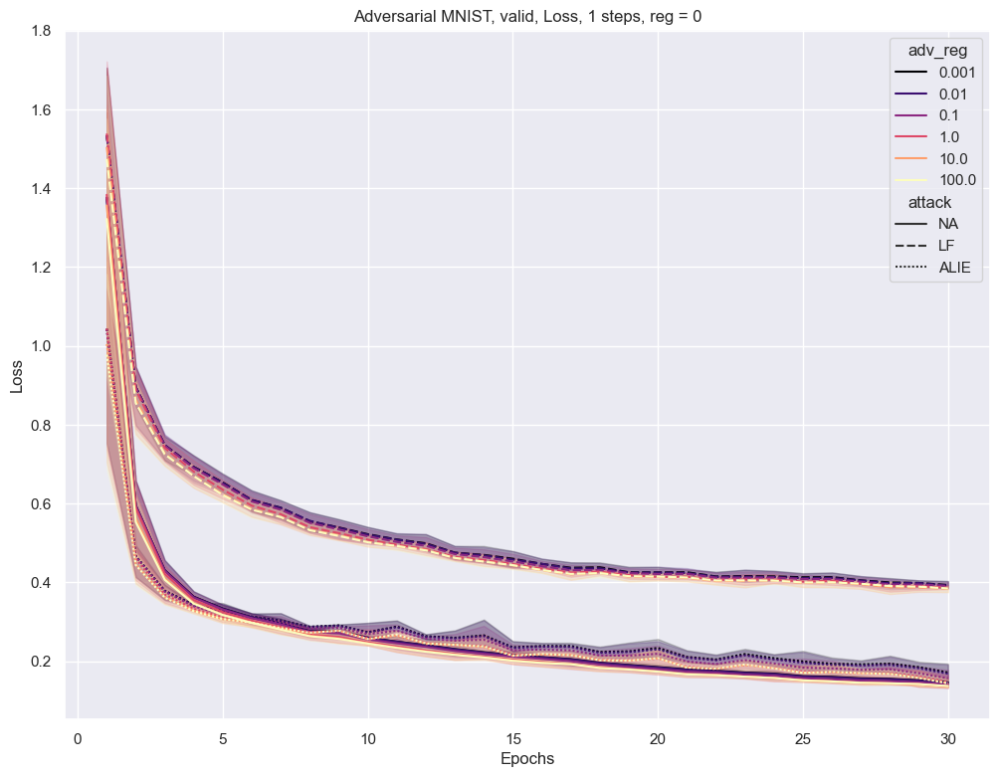

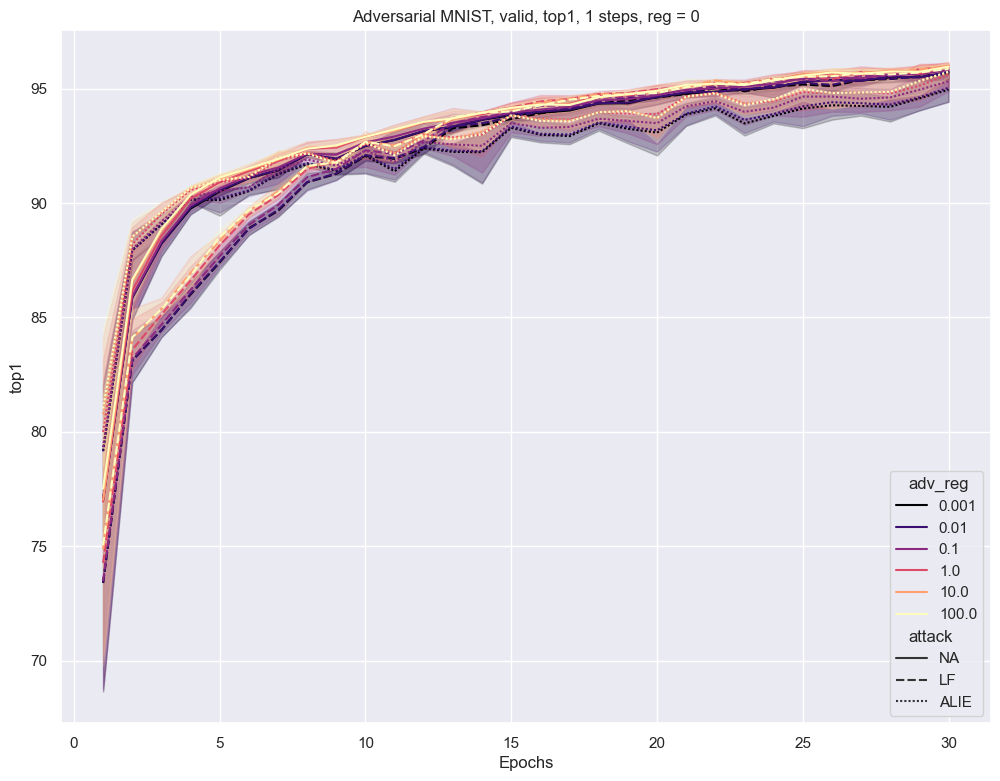

In [36]:
plot1(worker_steps=1, reg=0, adv_strength=1, mode="valid")

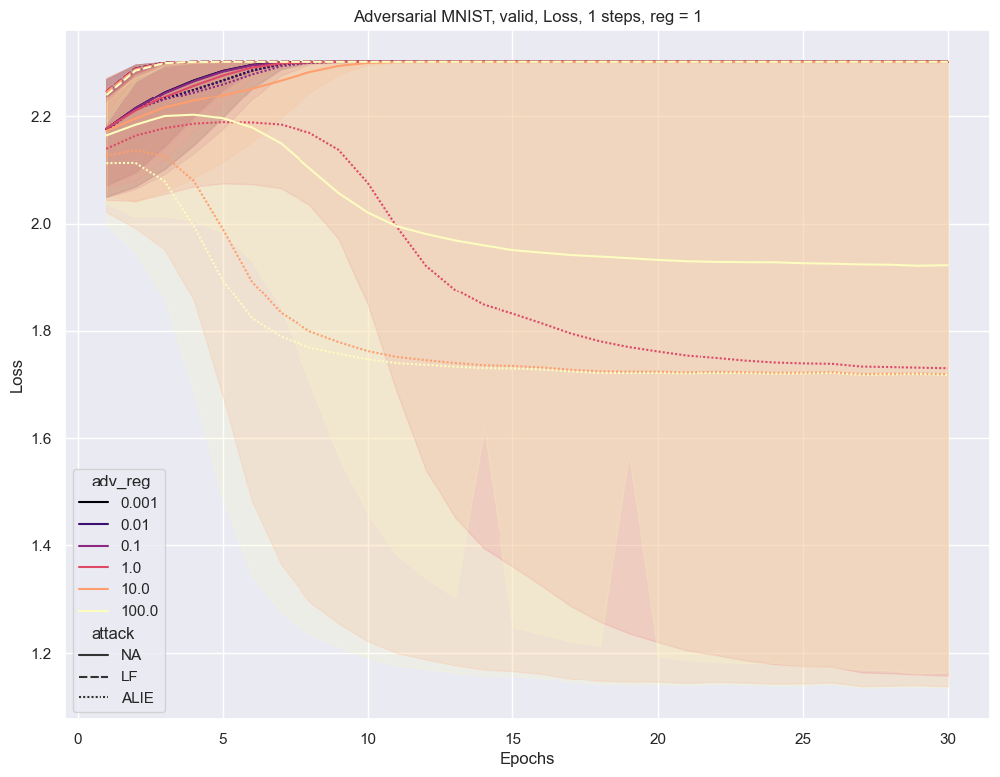

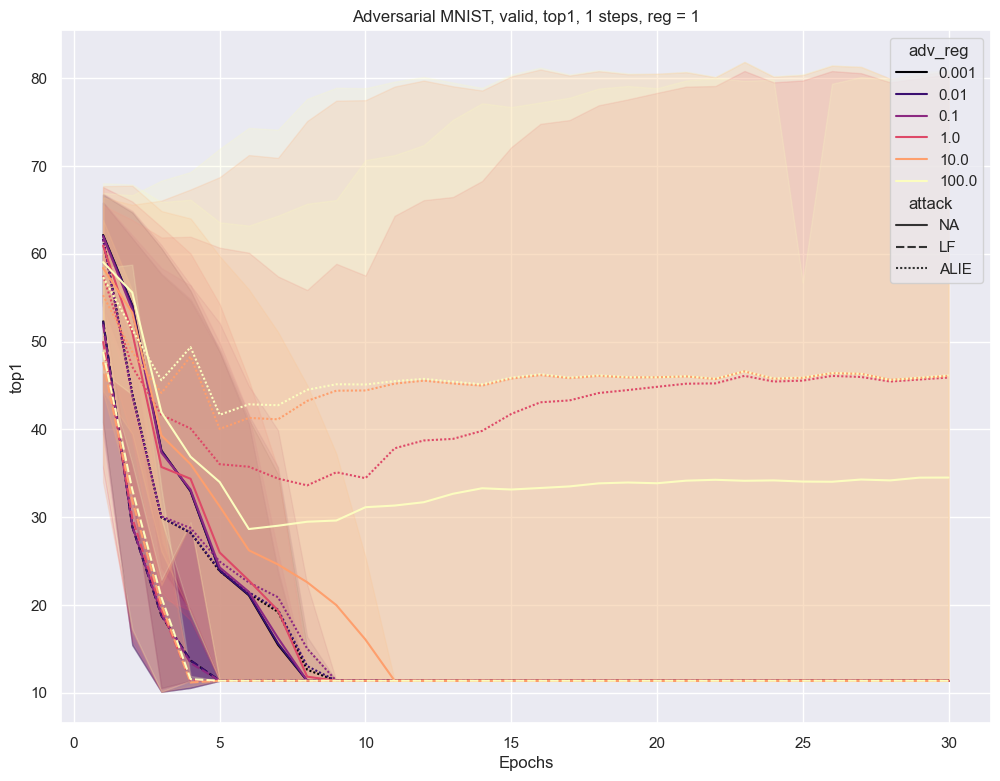

In [37]:
plot1(worker_steps=1, reg=1, adv_strength=1, mode="valid")

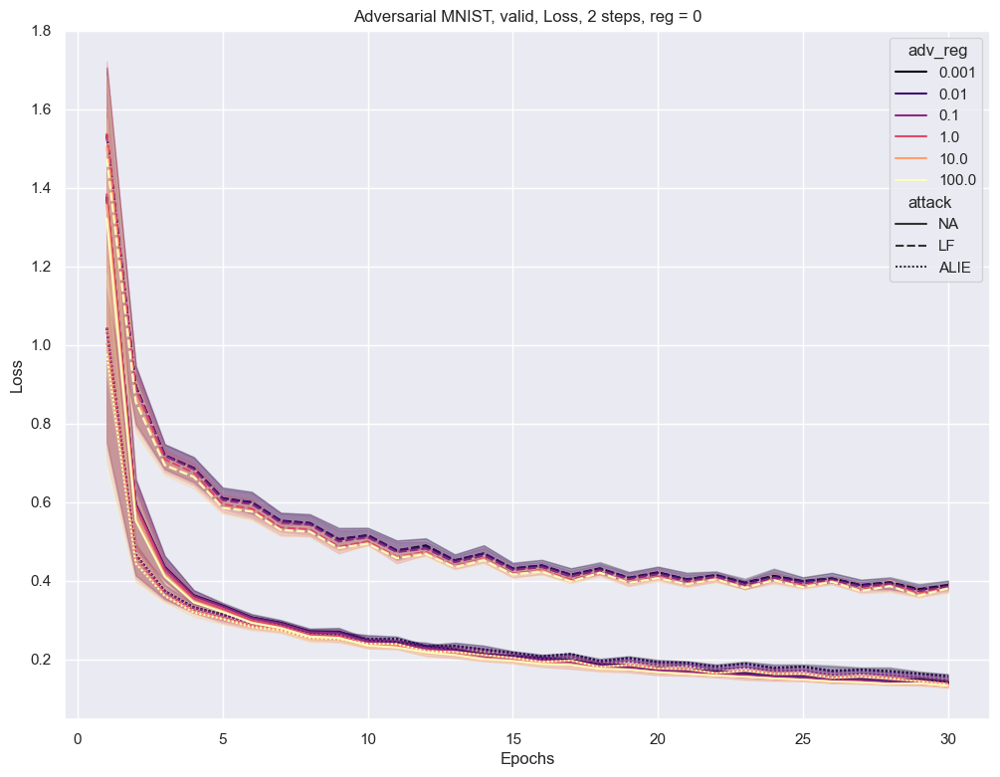

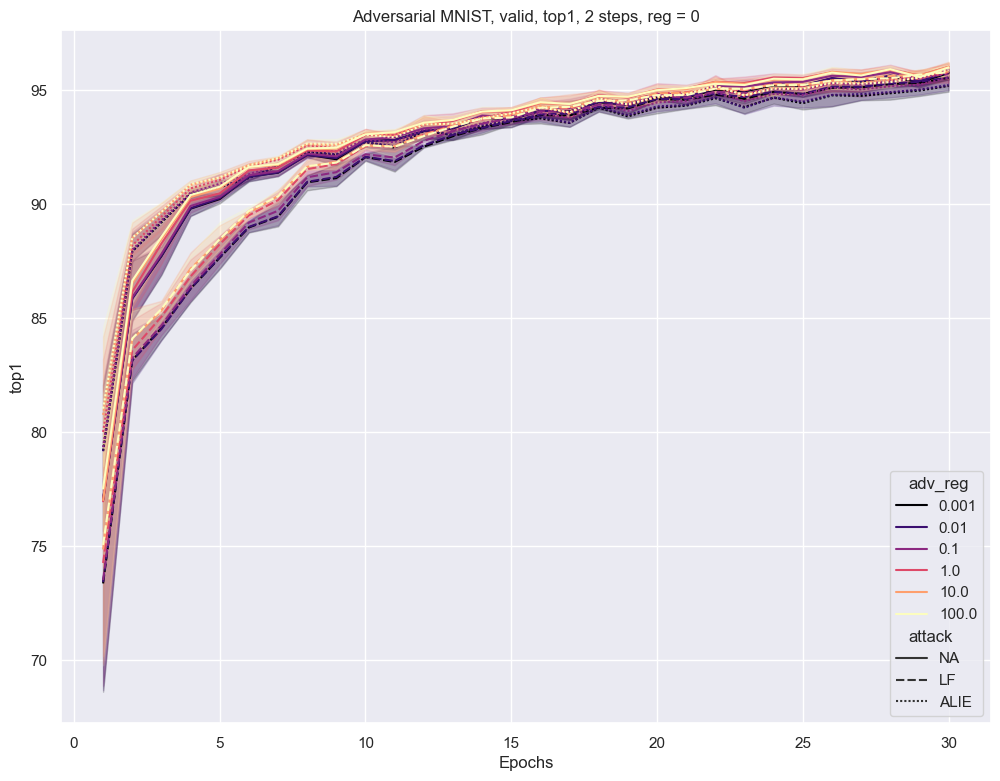

In [38]:
plot1(worker_steps=2, reg=0, adv_strength=1, mode="valid")

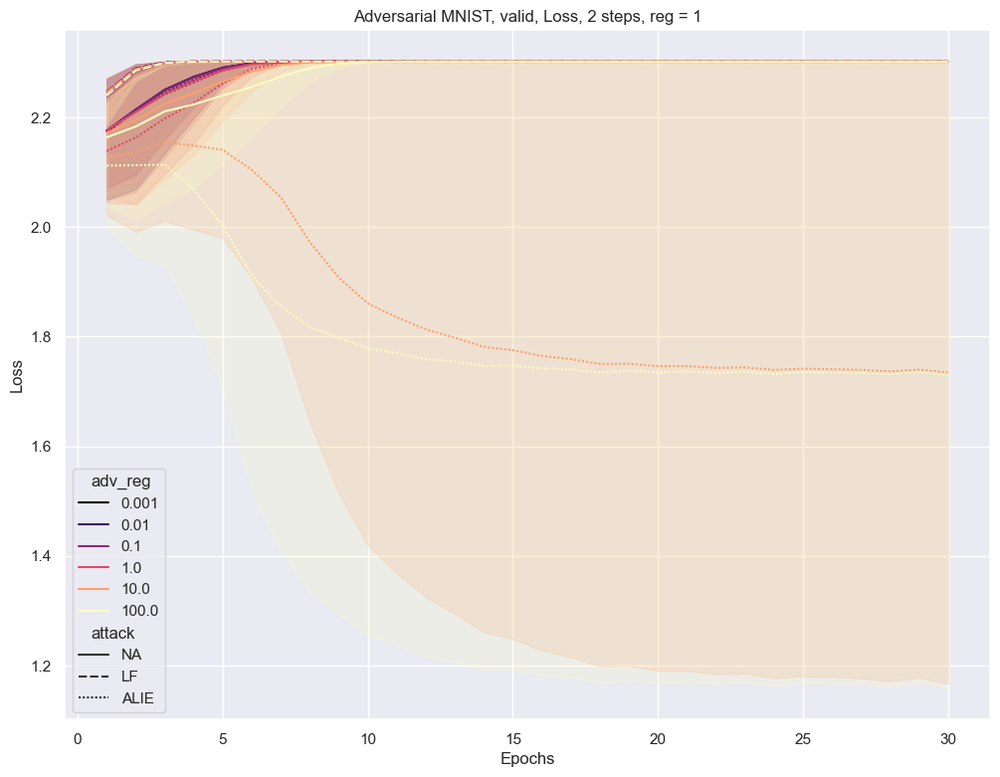

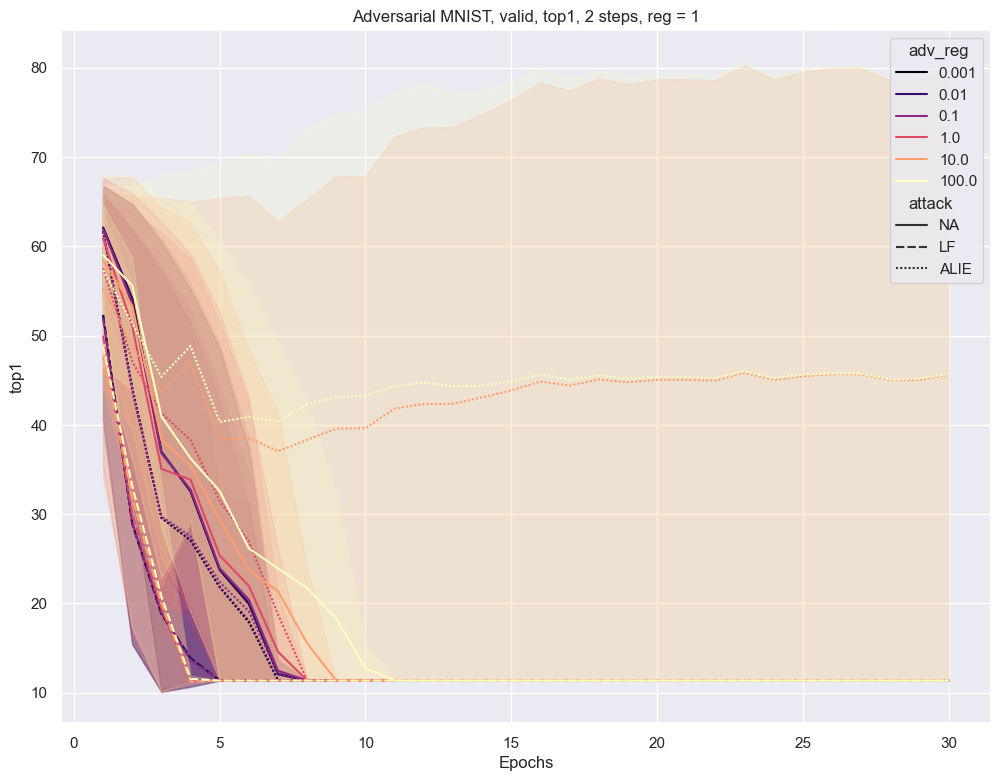

In [39]:
plot1(worker_steps=2, reg=1, adv_strength=1, mode="valid")

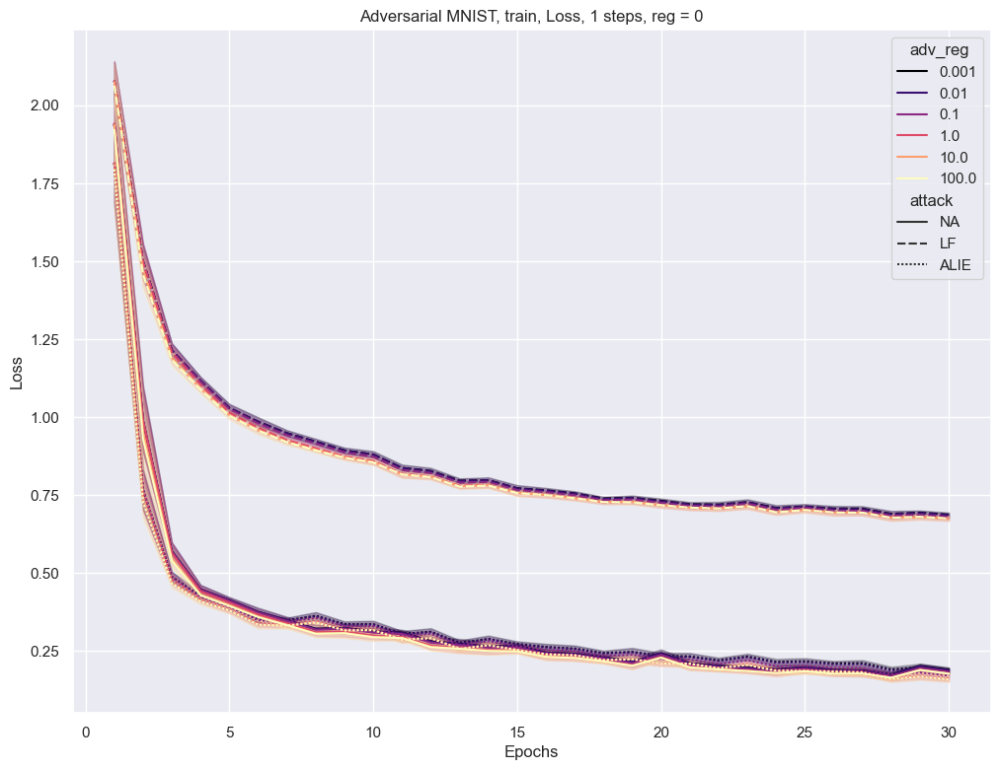

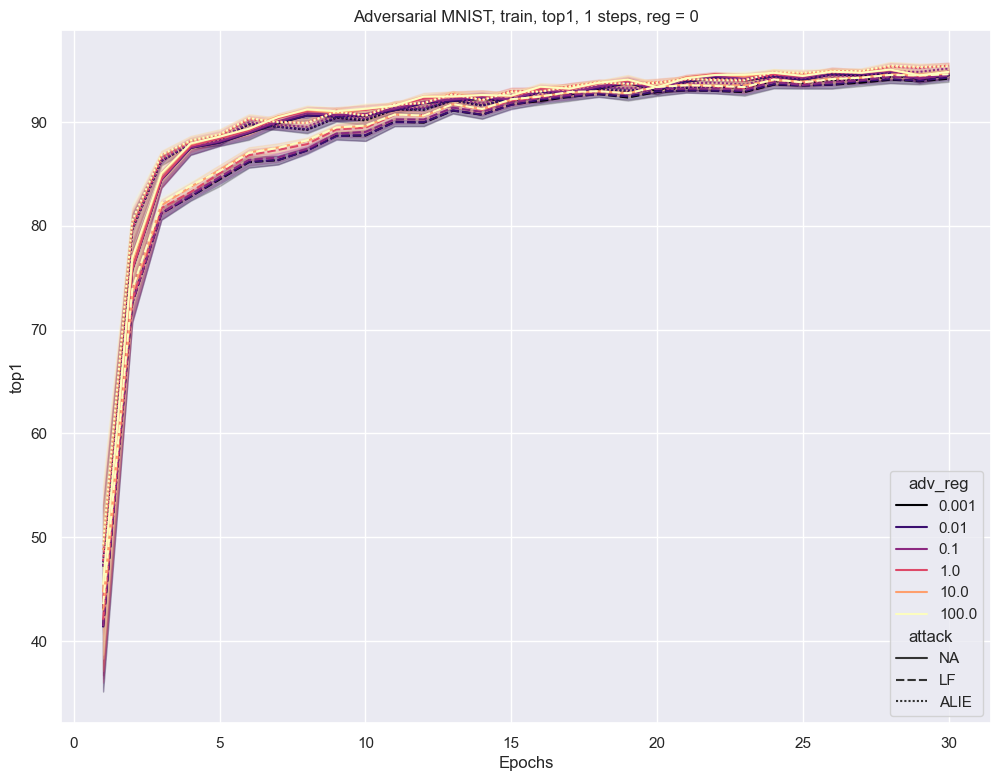

In [40]:
plot1(worker_steps=1, reg=0, adv_strength=1, mode="train")

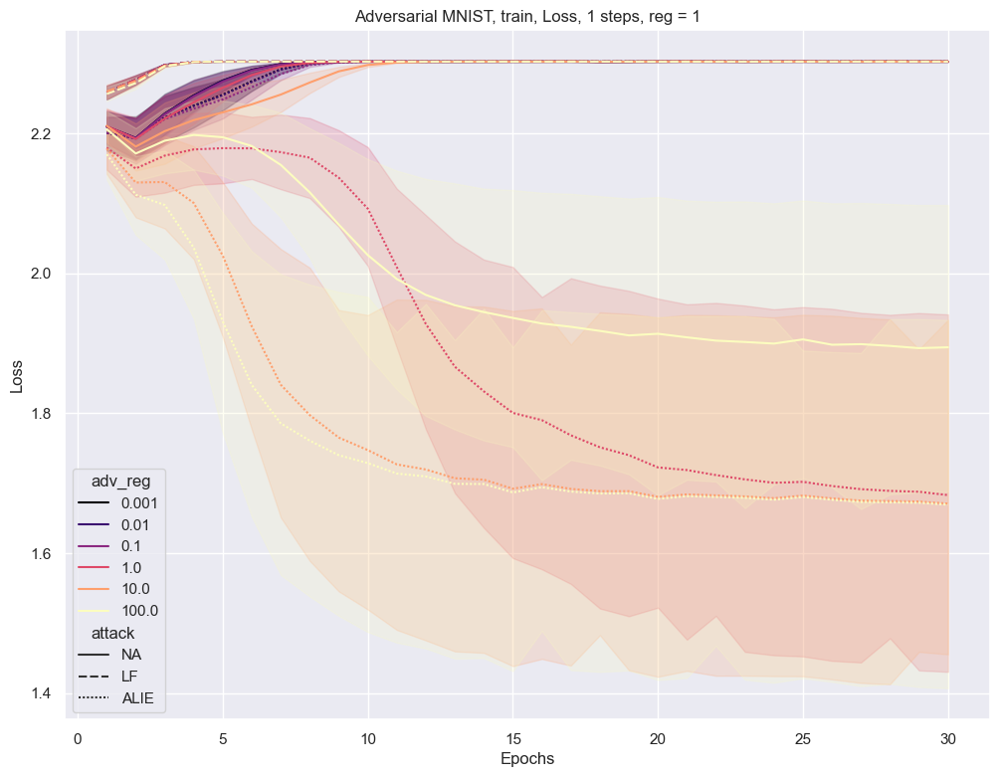

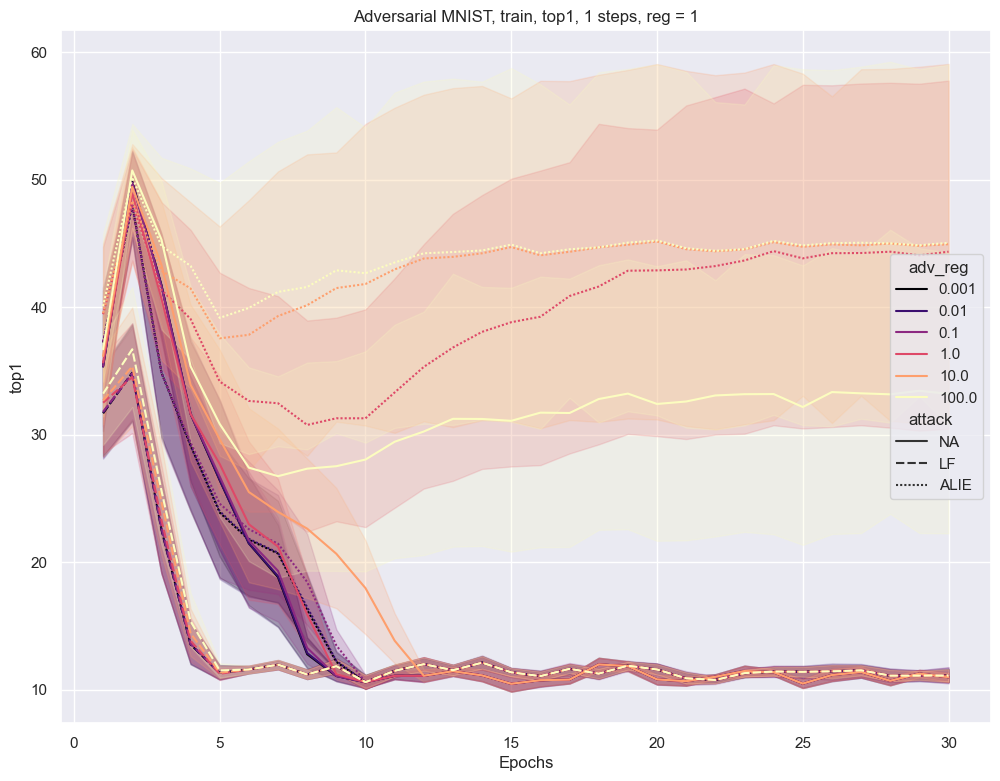

In [41]:
plot1(worker_steps=1, reg=1, adv_strength=1, mode="train")

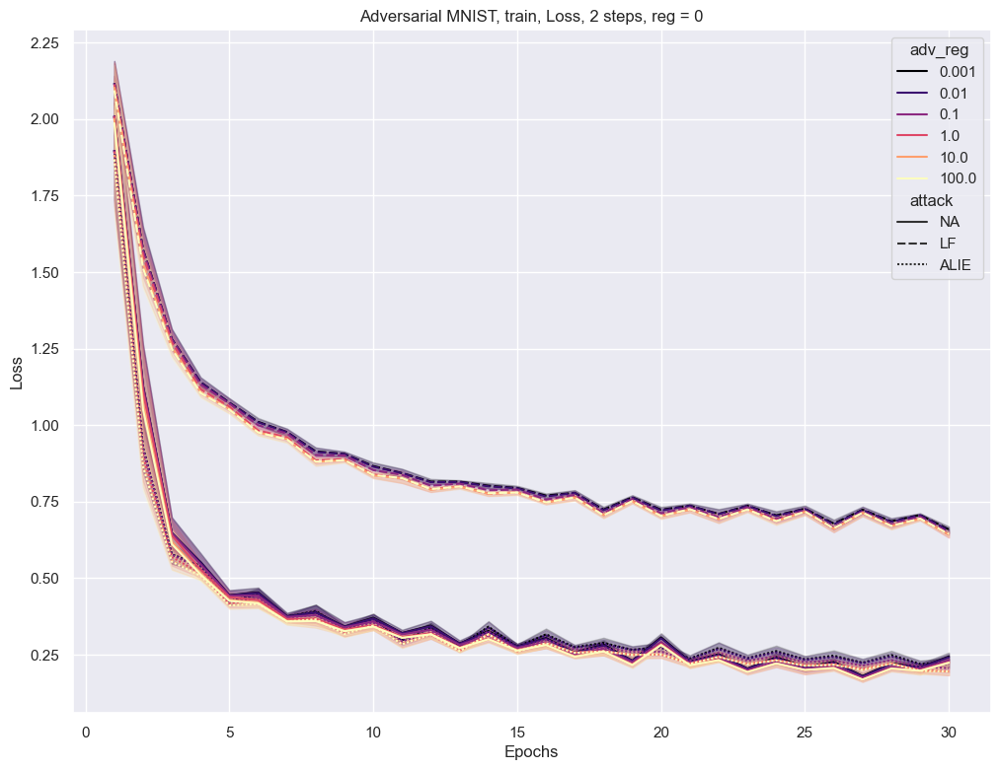

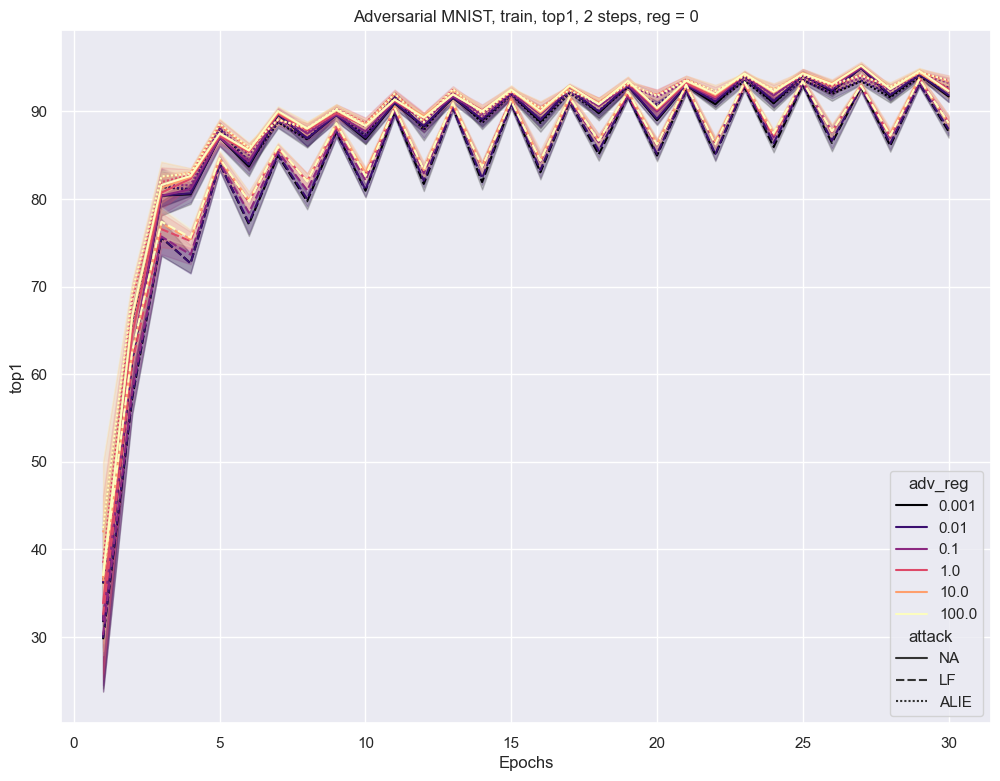

In [42]:
plot1(worker_steps=2, reg=0, adv_strength=1, mode="train")

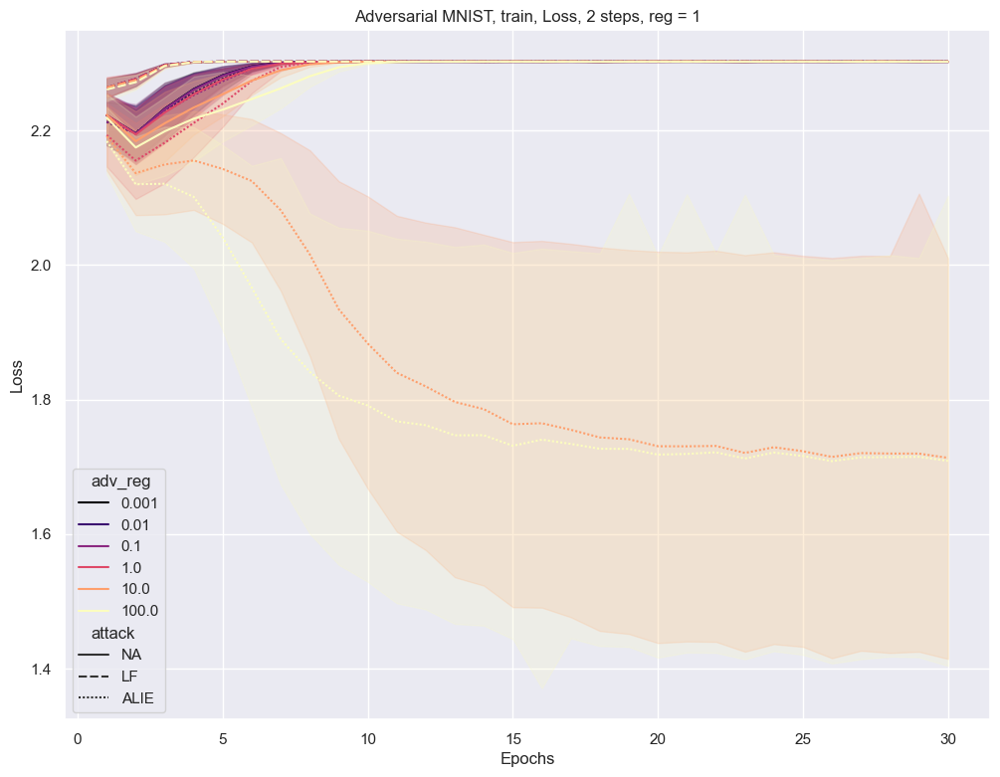

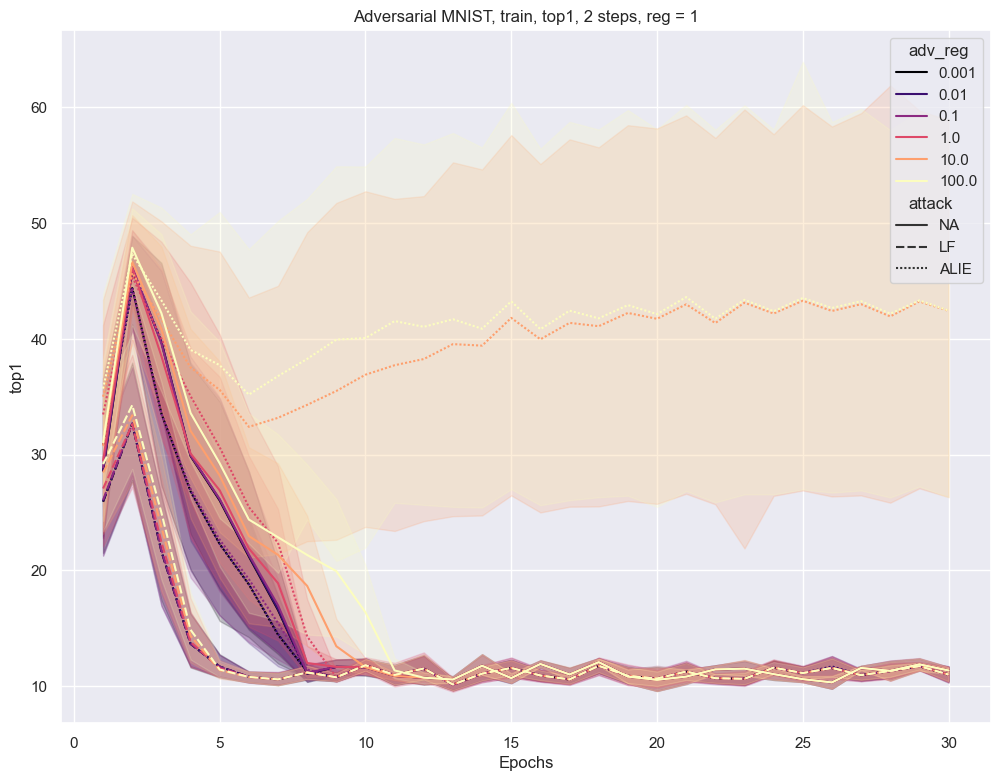

In [43]:
plot1(worker_steps=2, reg=1, adv_strength=1, mode="train")

# Experiment 2

In [16]:
EXP = "adv2"
log_dir = f"outputs/{EXP}"

In [17]:
exp_df_list = []
i = 0
for path in glob.glob(f"{log_dir}/*/stats"):
    # Parse logfile
    with open(path, "r") as f:
        lines = f.readlines()
        lines = [re.sub("tensor\(([^)]+)\)", '0.0', line) for line in lines]  # XXX: temporary fix
        stats = [ast.literal_eval(line) for line in lines]
        # Extract _meta variable
        for stat in stats:
            stat["type"] = stat["_meta"]["type"]
            del stat["_meta"]
    # Construct experiment dataframe
    stats_df = pd.DataFrame(stats)

    # Extract main args from path name
    experiment_dir = os.path.dirname(path)
    strategy = os.path.basename(os.path.dirname(experiment_dir))
    args_str = os.path.basename(experiment_dir)
    args_list = args_str.split("_")
    args_dict = {
        "n": int(args_list[0][1:]),
        "f": int(args_list[1][1:]),
        "agg": args_list[2],
        "attack": args_list[3],
        "seed": int(args_list[4][4:]),
        "reg": float(args_list[5][3:]),
        "adv_reg": float(args_list[6][6:]),
        "adv_strength": float(args_list[7][6:]),
        "worker_steps": int(args_list[8][6:]),
        "momentum": float(args_list[9][1:]),
        "strategy": strategy,
    }
    # Add args to stats dataframe
    for argname, argvalue in args_dict.items():
        stats_df[argname] = argvalue

    if len(exp_df_list) % 50 == 0:
        print(".", end="")
    i += 1

    exp_df_list.append(stats_df)

# Concat dataframes and remove irrelevant args
exp_df = pd.concat(exp_df_list).reset_index(drop=True).drop(columns=irrelevant_args)
print()
display(exp_df)

.......


,E,B,Loss,top1,model_l2_norm,adversary_l2_norm,type,attack,seed,reg,adv_reg,adv_strength,worker_steps,momentum
0,1,0.0,2.314466,10.625000,8.861330,27.795630,train,IPM,0,0.0,0.0,1.0,1,0.9
1,1,10.0,2.249269,20.781250,8.861328,27.795630,train,IPM,0,0.0,0.0,1.0,1,0.9
2,1,20.0,2.217639,26.406250,8.862087,27.795631,train,IPM,0,0.0,0.0,1.0,1,0.9
3,1,30.0,2.178027,32.656250,8.863378,27.795630,train,IPM,0,0.0,0.0,1.0,1,0.9
4,1,40.0,2.136075,36.093750,8.865265,27.795624,train,IPM,0,0.0,0.0,1.0,1,0.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91570,30,60.0,2.302345,10.937500,0.015647,0.000015,train,NA,2,1.0,1.0,1.0,1,0.9
91571,30,70.0,2.302465,11.562500,0.015799,0.000015,train,NA,2,1.0,1.0,1.0,1,0.9
91572,30,80.0,2.302030,12.656250,0.016064,0.000014,train,NA,2,1.0,1.0,1.0,1,0.9
91573,30,90.0,2.302556,10.312500,0.016385,0.000013,train,NA,2,1.0,1.0,1.0,1,0.9


In [18]:
# Take only validation loss
train_exp_df = exp_df[exp_df["type"] != "validation"].drop(columns=["type"])
valid_exp_df = exp_df[exp_df["type"] == "validation"].drop(columns=["type"])

In [19]:
train_exp_df

,E,B,Loss,top1,model_l2_norm,adversary_l2_norm,attack,seed,reg,adv_reg,adv_strength,worker_steps,momentum
0,1,0.0,2.314466,10.62500,8.861330,27.795630,IPM,0,0.0,0.0,1.0,1,0.9
1,1,10.0,2.249269,20.78125,8.861328,27.795630,IPM,0,0.0,0.0,1.0,1,0.9
2,1,20.0,2.217639,26.40625,8.862087,27.795631,IPM,0,0.0,0.0,1.0,1,0.9
3,1,30.0,2.178027,32.65625,8.863378,27.795630,IPM,0,0.0,0.0,1.0,1,0.9
4,1,40.0,2.136075,36.09375,8.865265,27.795624,IPM,0,0.0,0.0,1.0,1,0.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91569,30,50.0,2.302246,11.40625,0.015580,0.000016,NA,2,1.0,1.0,1.0,1,0.9
91570,30,60.0,2.302345,10.93750,0.015647,0.000015,NA,2,1.0,1.0,1.0,1,0.9
91571,30,70.0,2.302465,11.56250,0.015799,0.000015,NA,2,1.0,1.0,1.0,1,0.9
91572,30,80.0,2.302030,12.65625,0.016064,0.000014,NA,2,1.0,1.0,1.0,1,0.9


In [20]:
def plot2(worker_steps, reg, adv_reg, mode):
    df = train_exp_df if mode == "train" else valid_exp_df
    plot_df = df[(df["worker_steps"] == worker_steps) & 
                 (df["reg"] == reg) & 
                 (df["adv_reg"] == adv_reg)]
    for metric in metrics:
        plt.figure()
        sns.lineplot(data=plot_df,
            x="E", y=metric, hue="attack", palette="tab10", hue_order=["NA", "LF", "ALIE", "IPM"], style="momentum")
        plt.title(f"Adversarial MNIST, {mode}, {metric}, {worker_steps} steps, reg = {reg}, adv_reg = {adv_reg}")
        plt.xlabel("Epochs")
        plt.ylabel(metric)
        # plt.yscale("log")
        plt.savefig(f"outputs/advmom_{metric}_wstep{worker_steps}_reg{reg}_advreg{adv_reg}_{mode}.pdf")

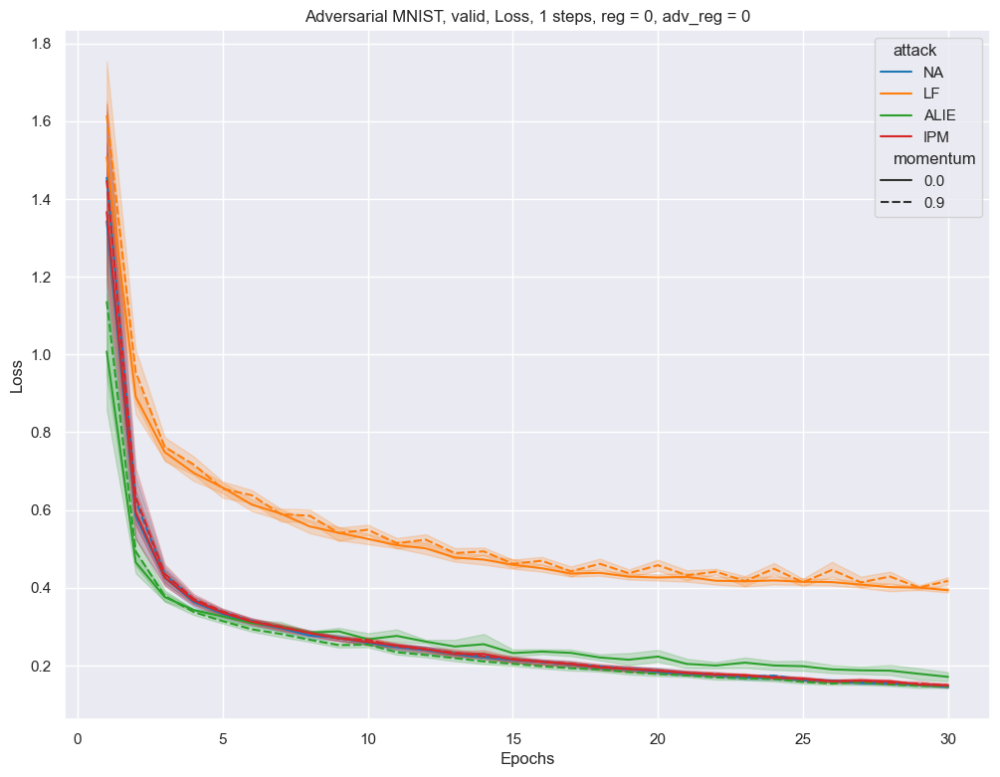

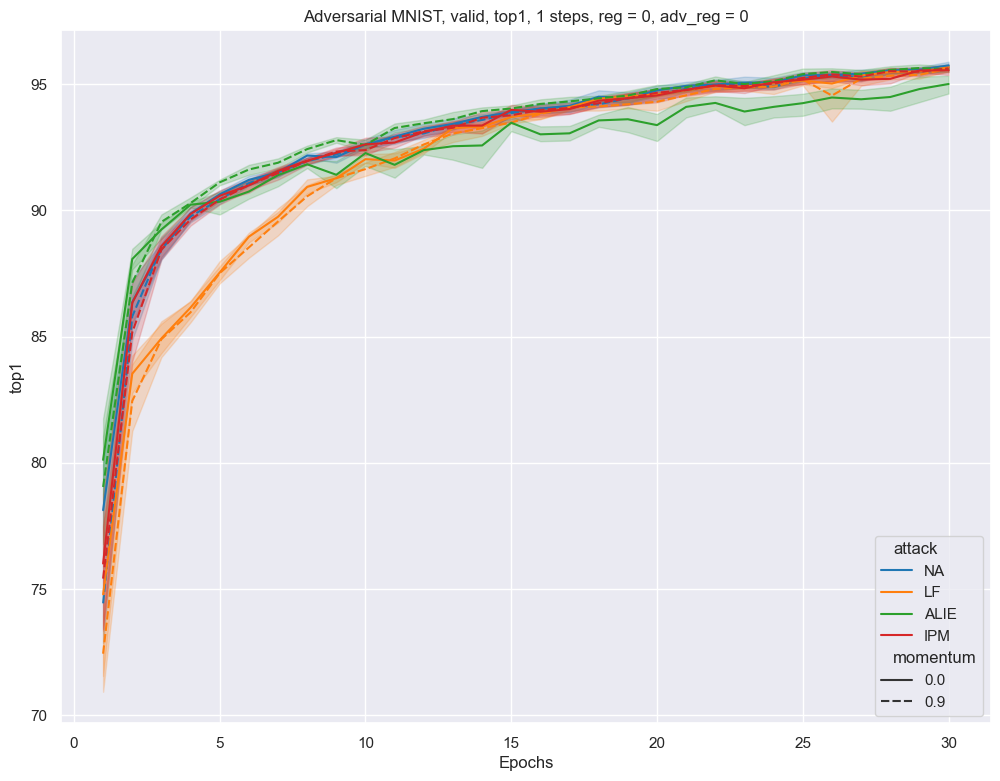

In [21]:
plot2(worker_steps=1, reg=0, adv_reg=0, mode="valid")

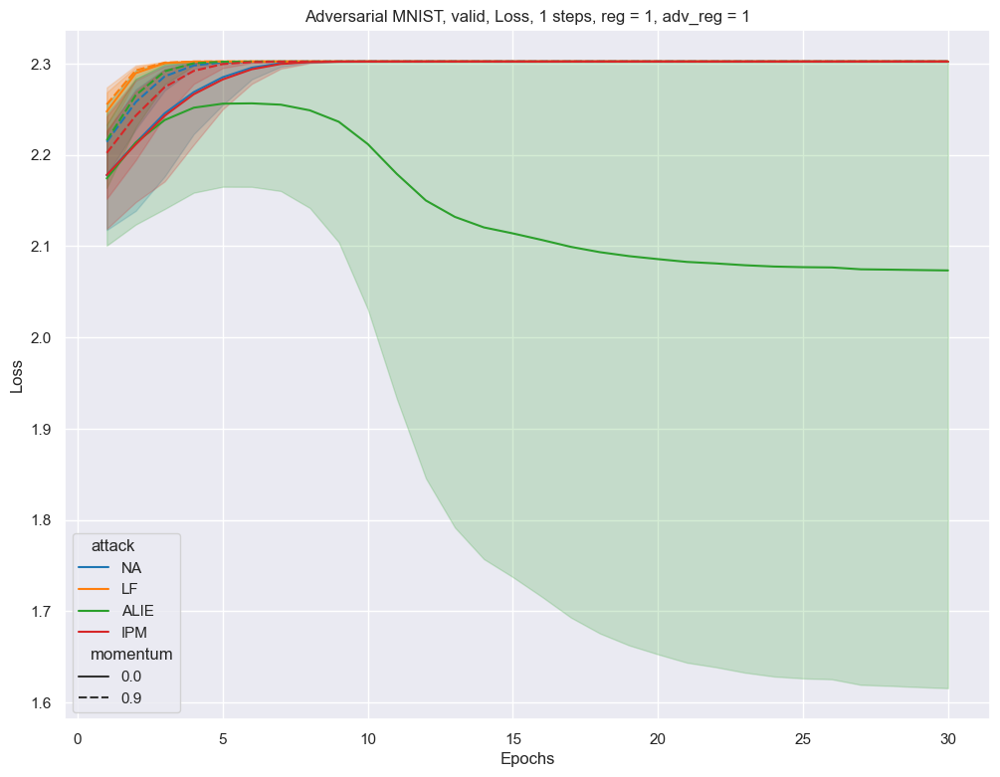

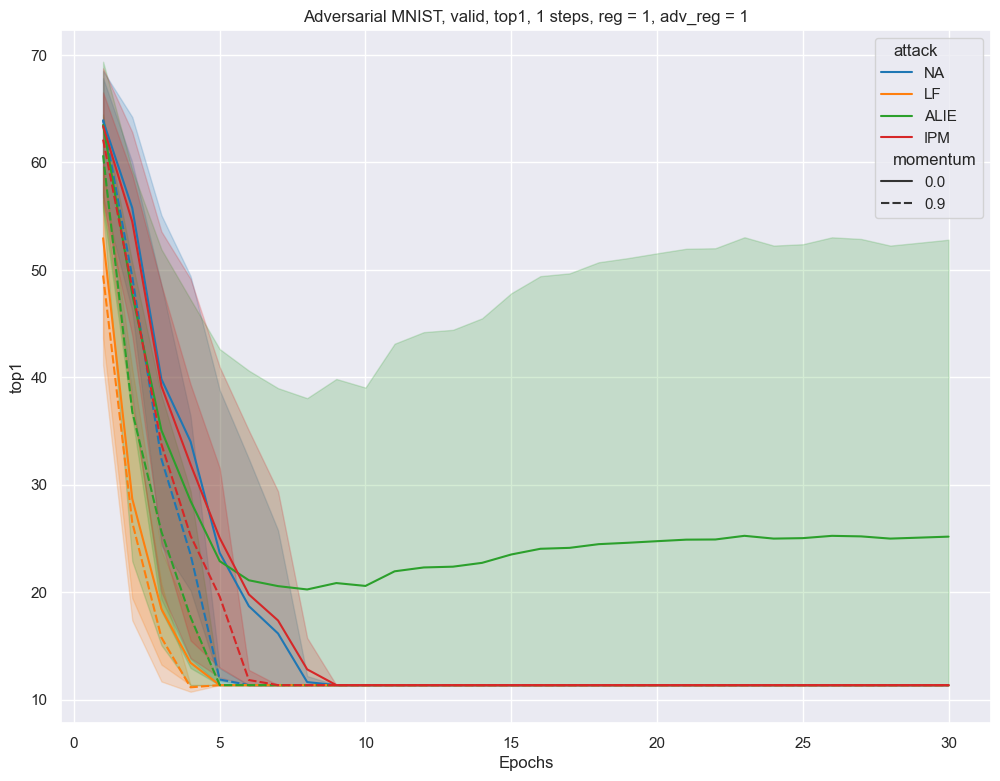

In [22]:
plot2(worker_steps=1, reg=1, adv_reg=1, mode="valid")

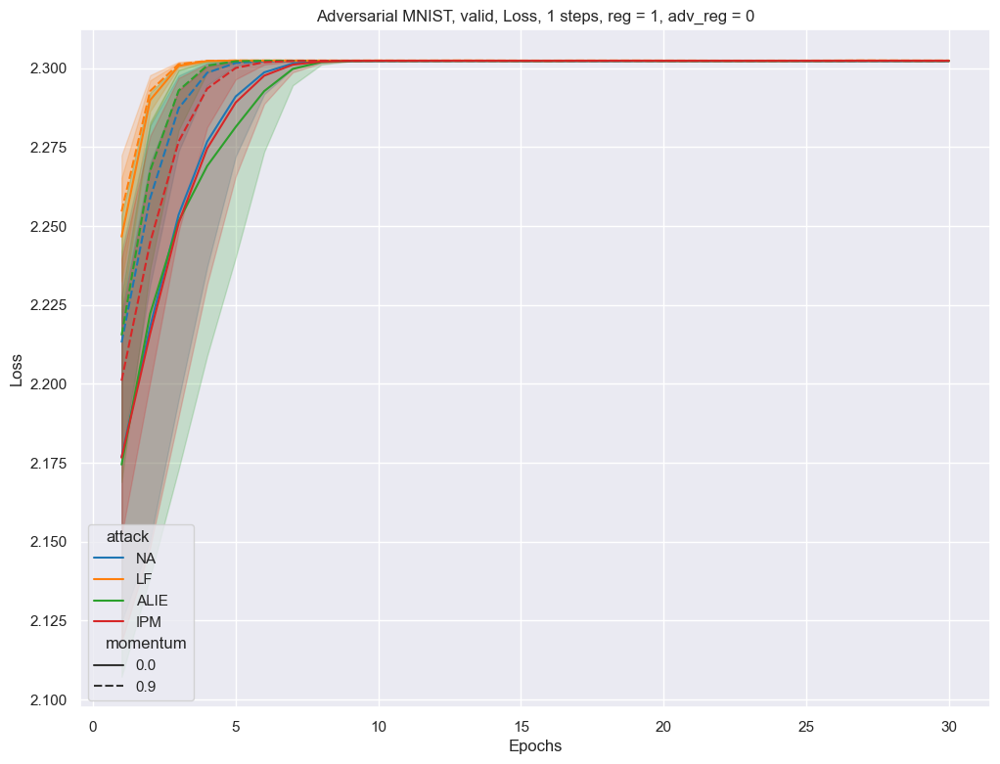

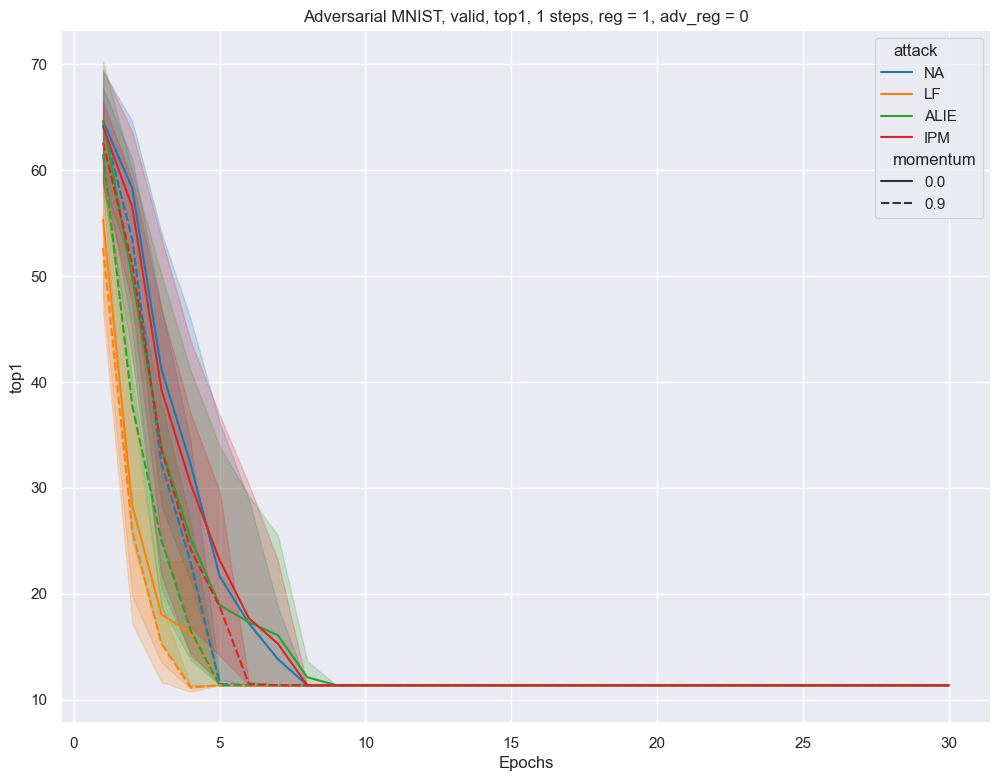

In [23]:
plot2(worker_steps=1, reg=1, adv_reg=0, mode="valid")

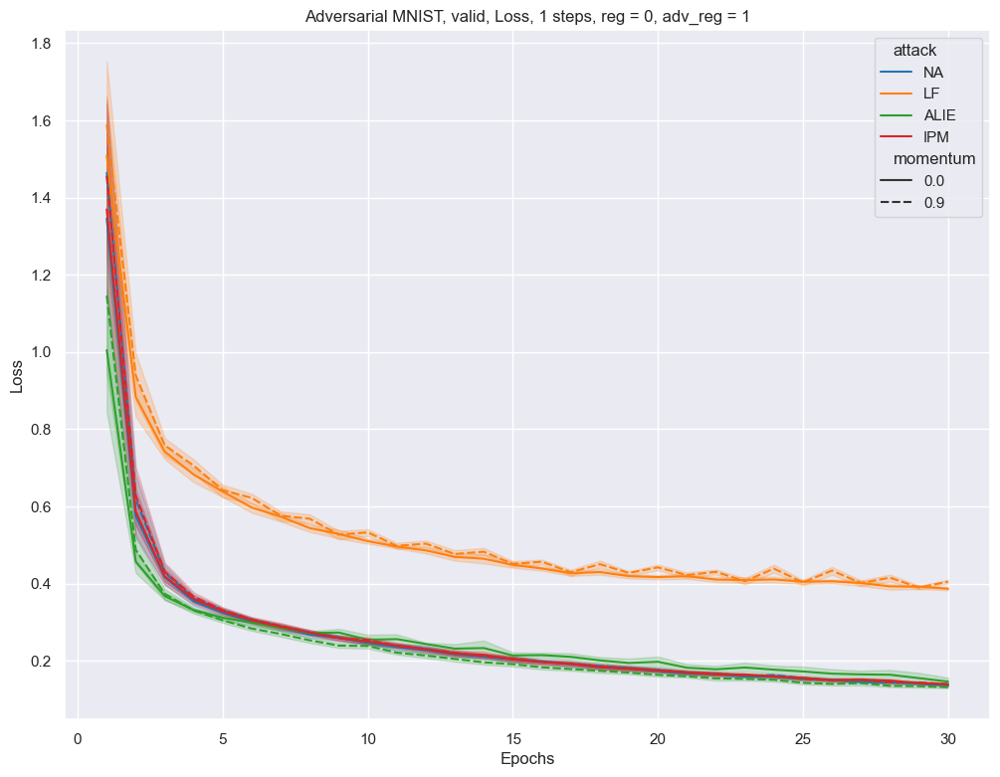

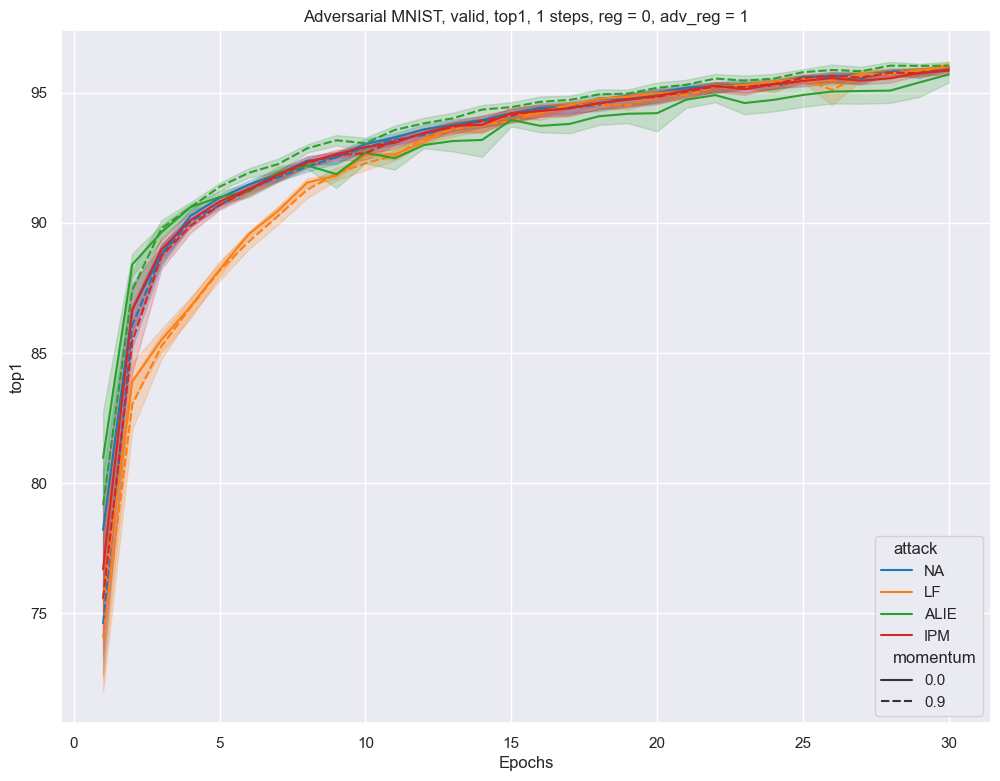

In [24]:
plot2(worker_steps=1, reg=0, adv_reg=1, mode="valid")

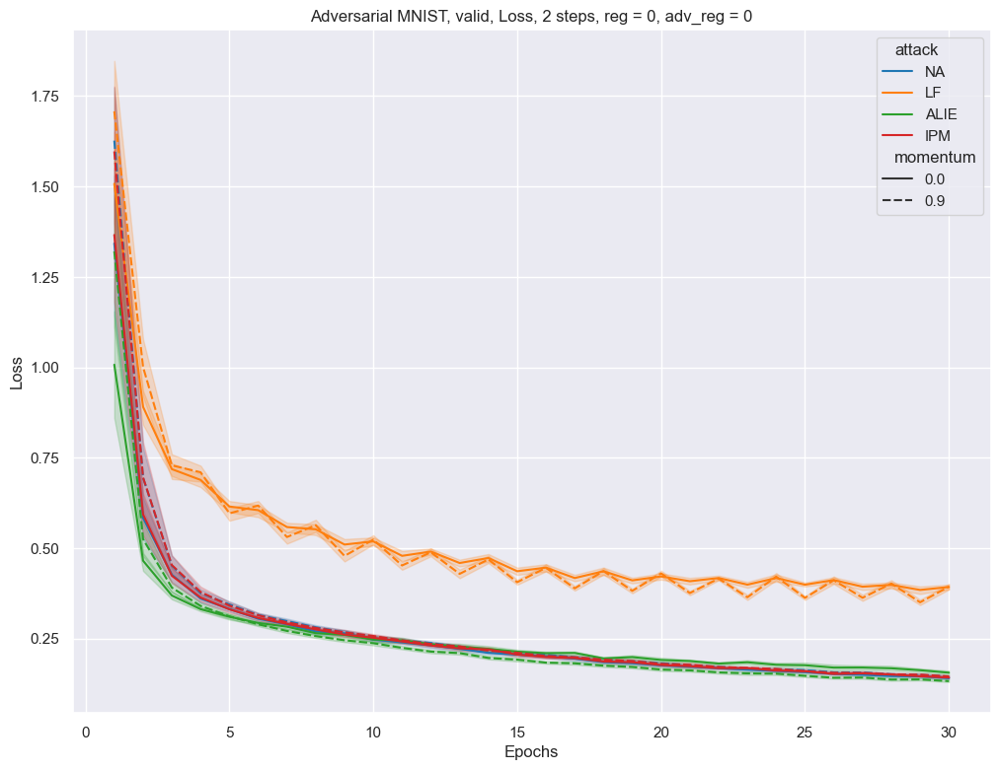

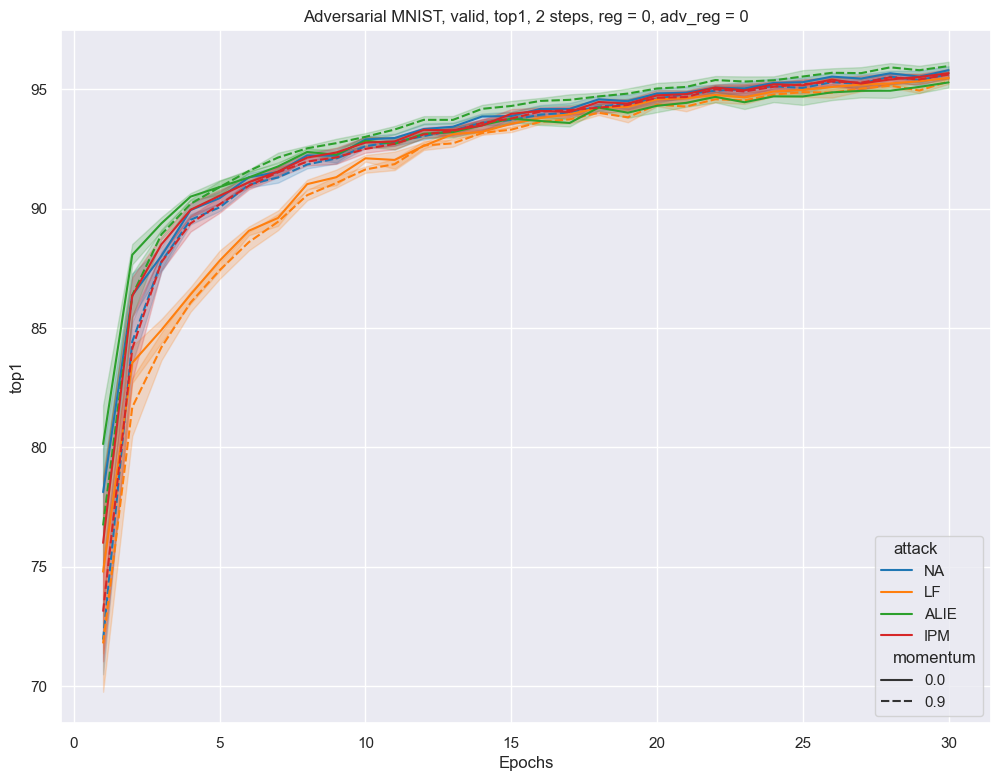

In [25]:
plot2(worker_steps=2, reg=0, adv_reg=0, mode="valid")

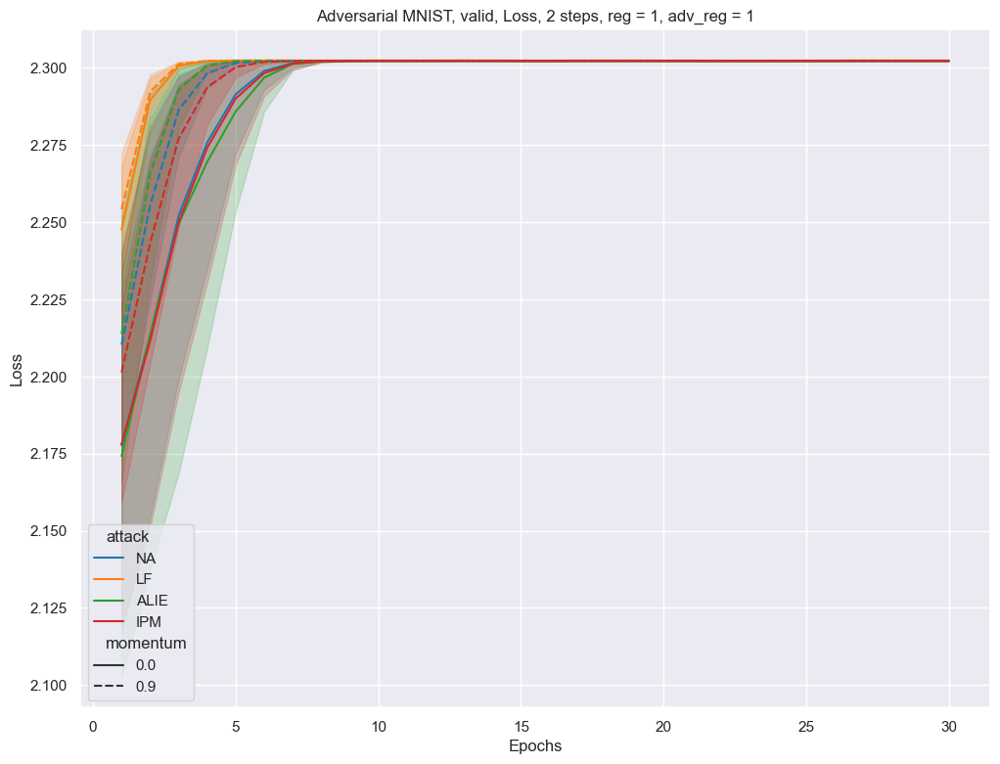

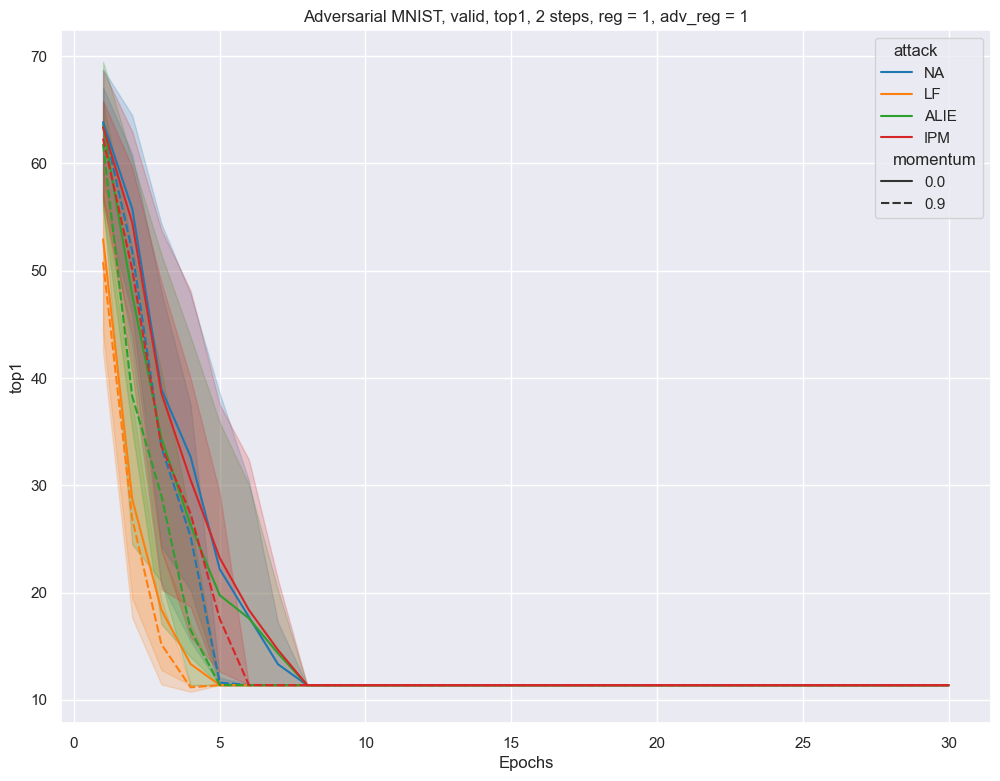

In [26]:
plot2(worker_steps=2, reg=1, adv_reg=1, mode="valid")

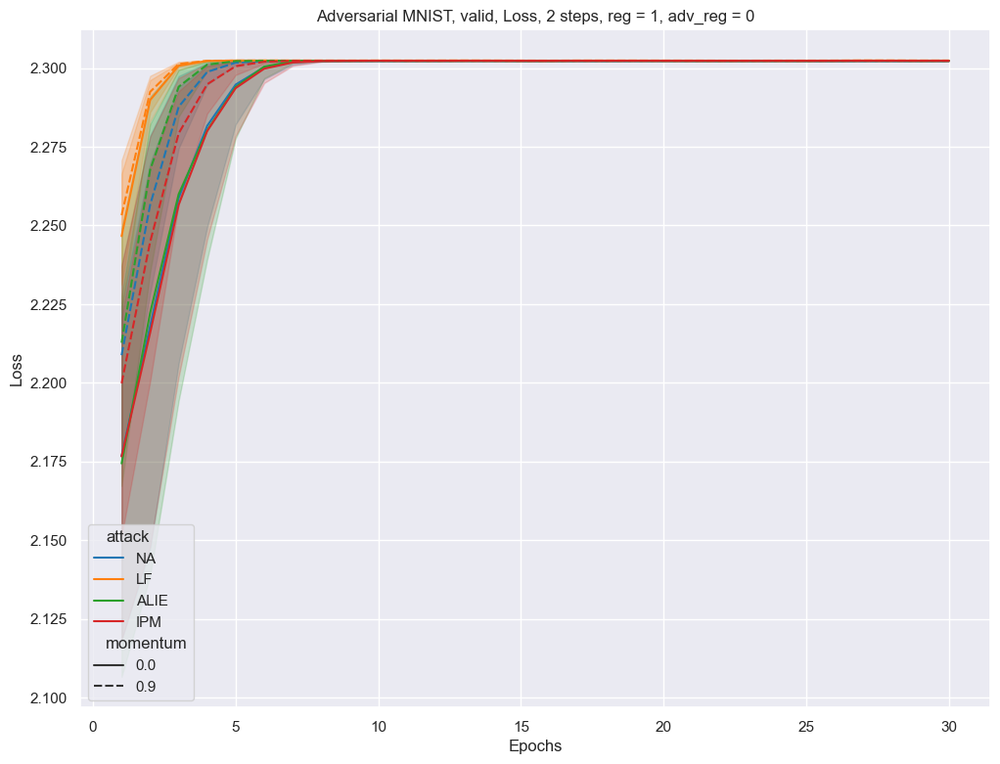

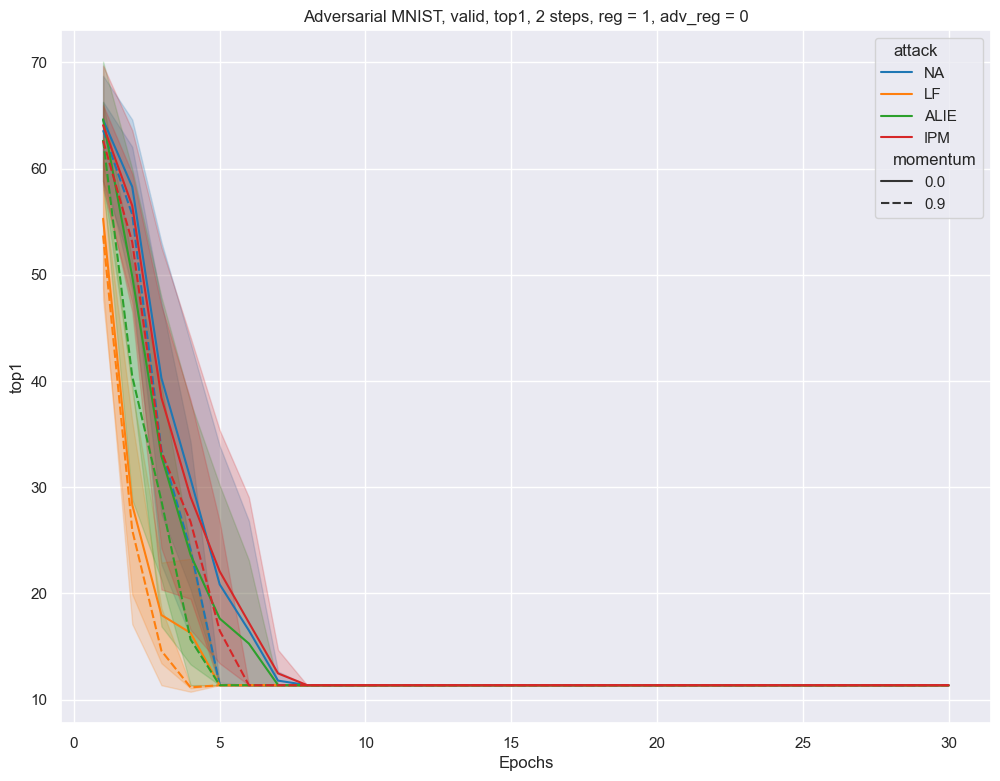

In [27]:
plot2(worker_steps=2, reg=1, adv_reg=0, mode="valid")

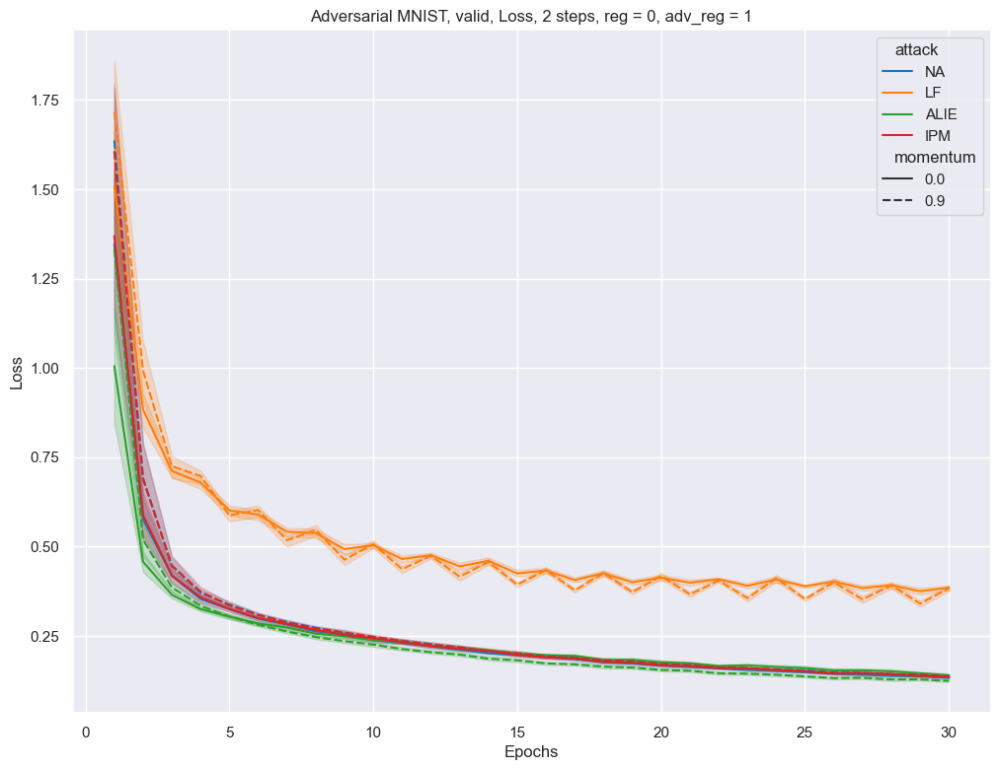

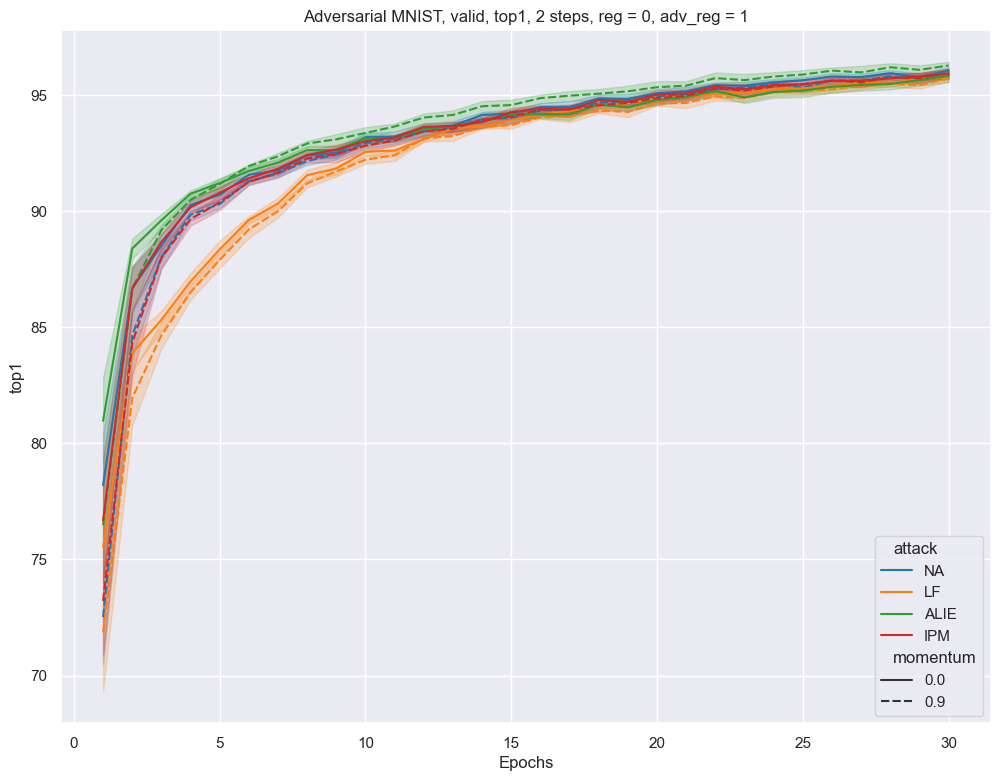

In [28]:
plot2(worker_steps=2, reg=0, adv_reg=1, mode="valid")

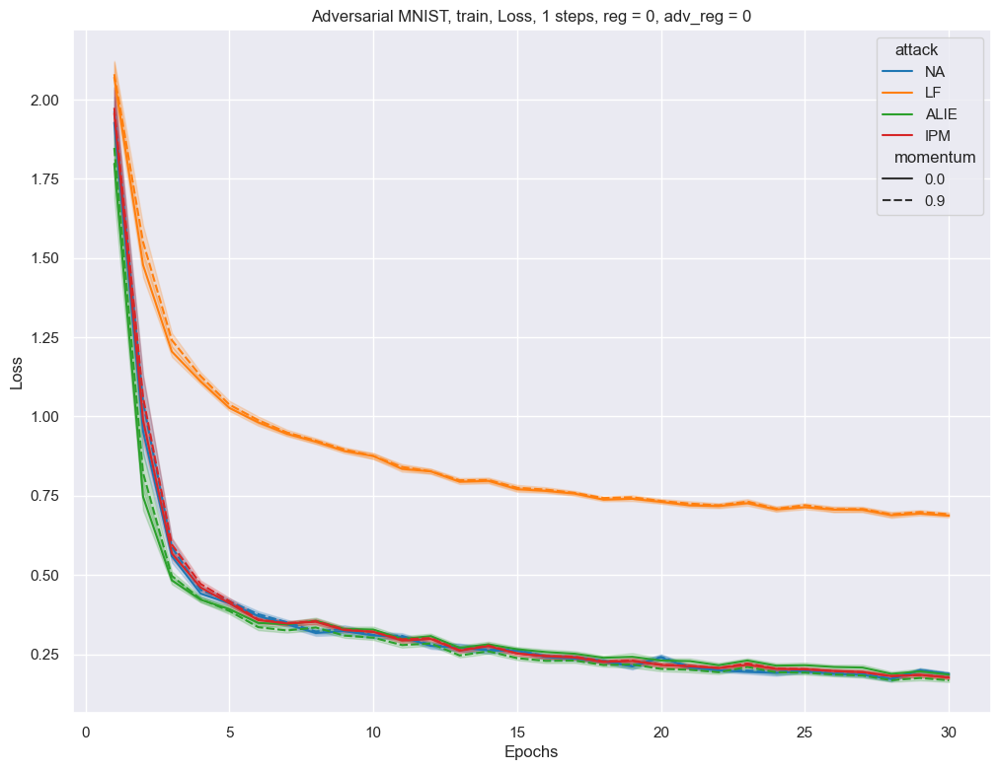

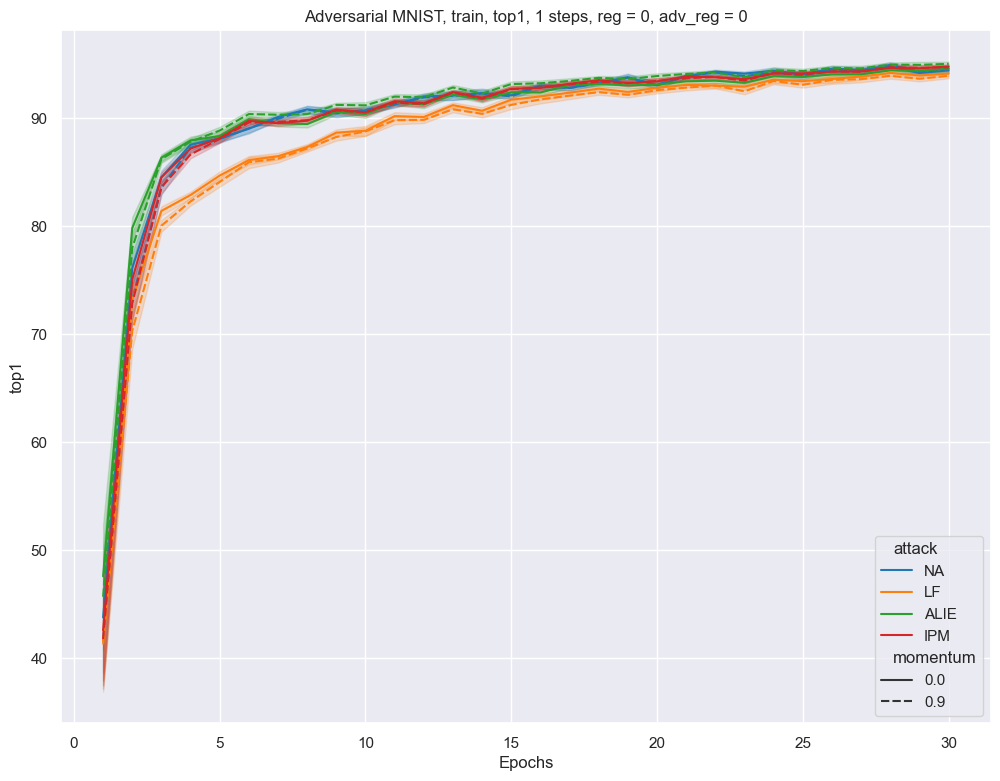

In [29]:
plot2(worker_steps=1, reg=0, adv_reg=0, mode="train")

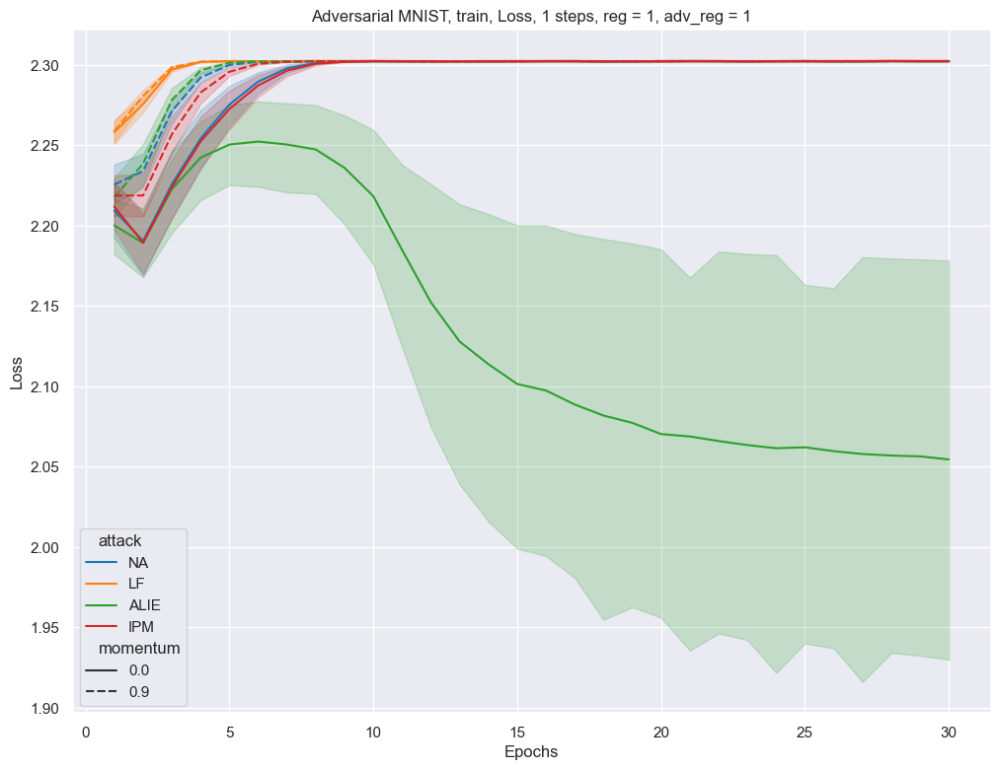

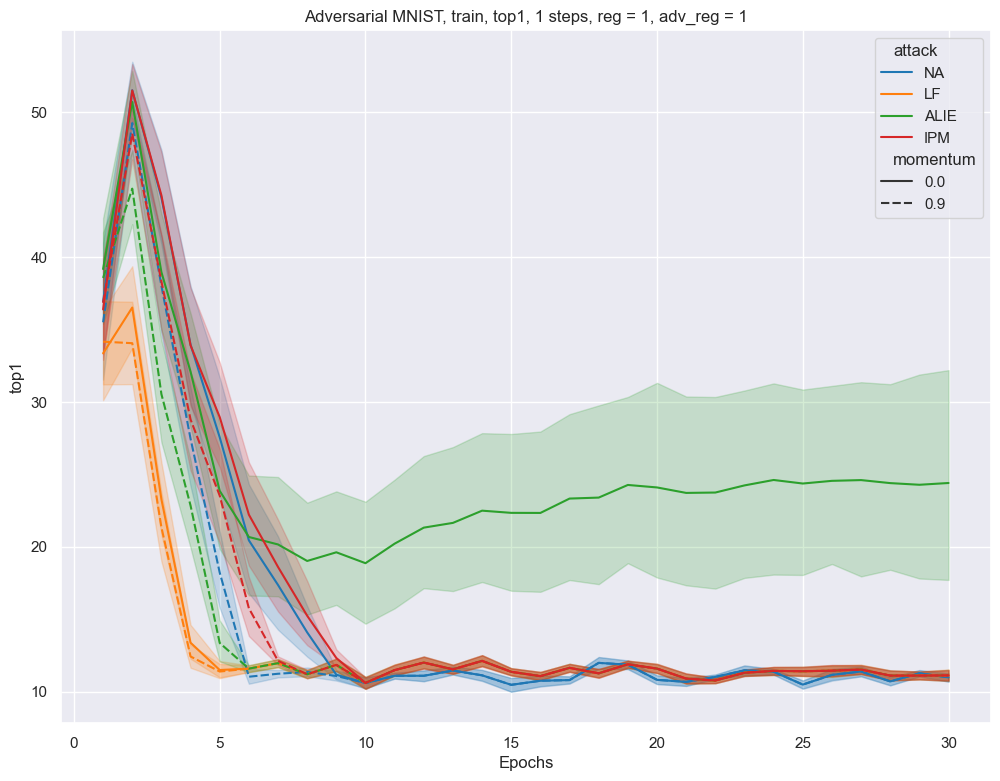

In [30]:
plot2(worker_steps=1, reg=1, adv_reg=1, mode="train")

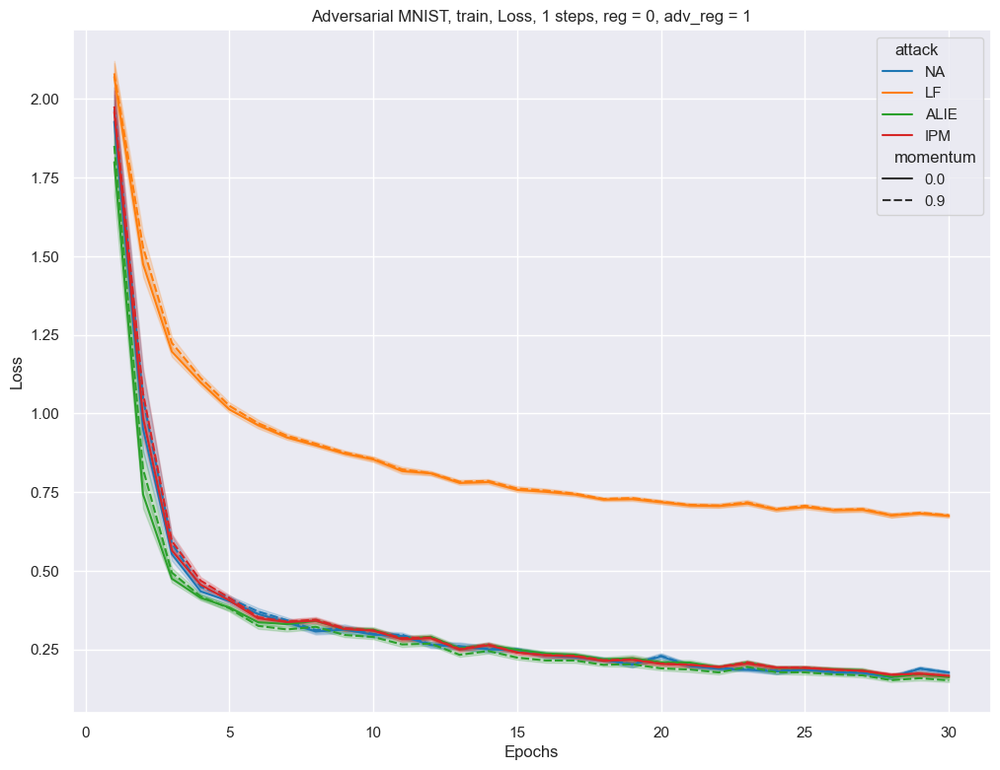

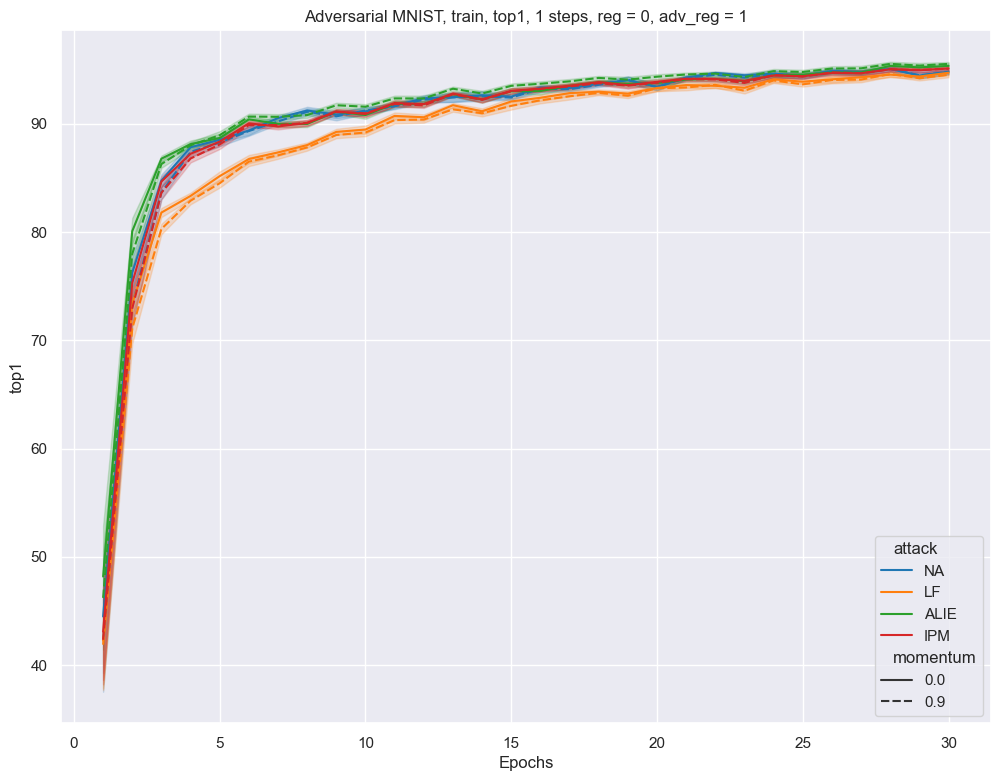

In [31]:
plot2(worker_steps=1, reg=0, adv_reg=1, mode="train")

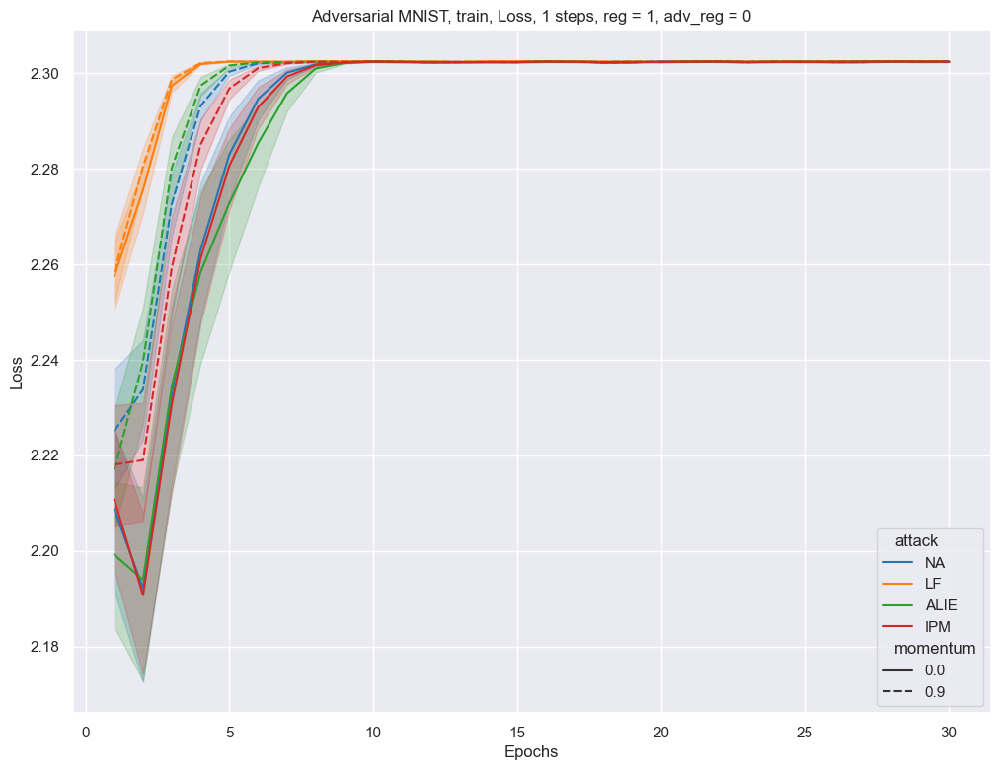

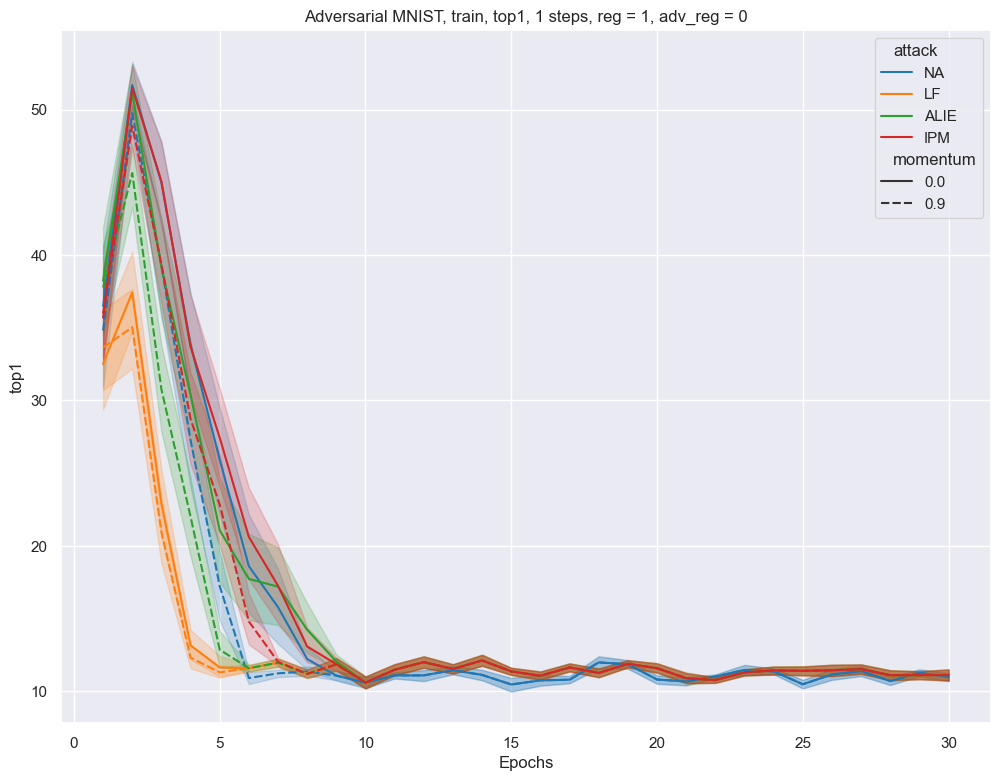

In [32]:
plot2(worker_steps=1, reg=1, adv_reg=0, mode="train")

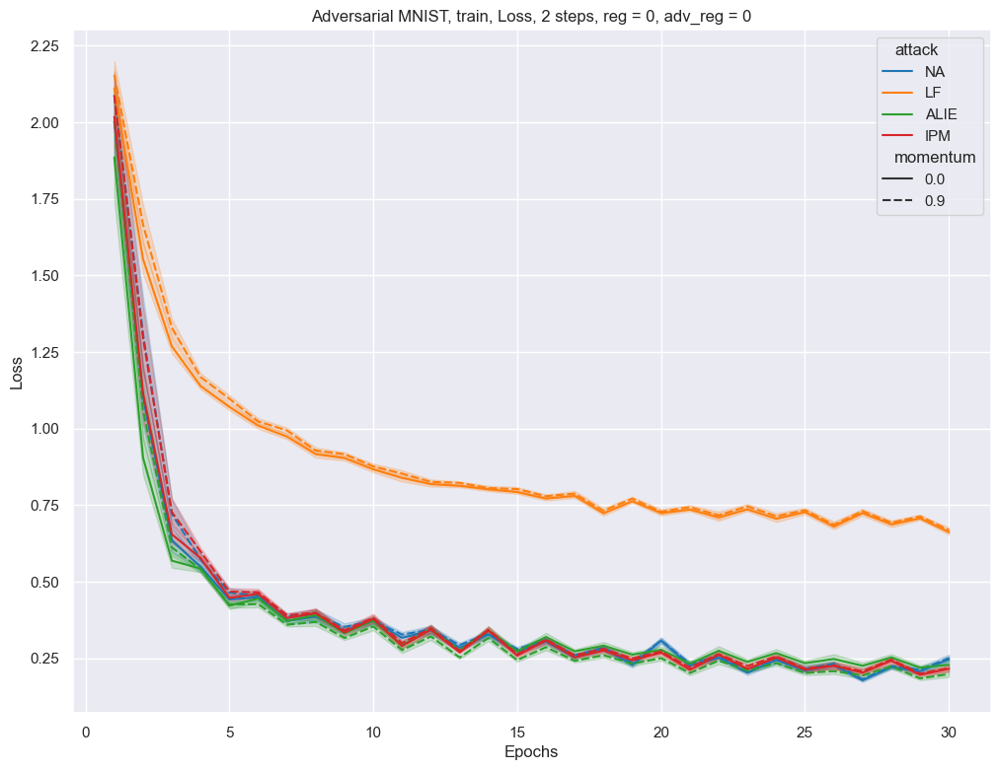

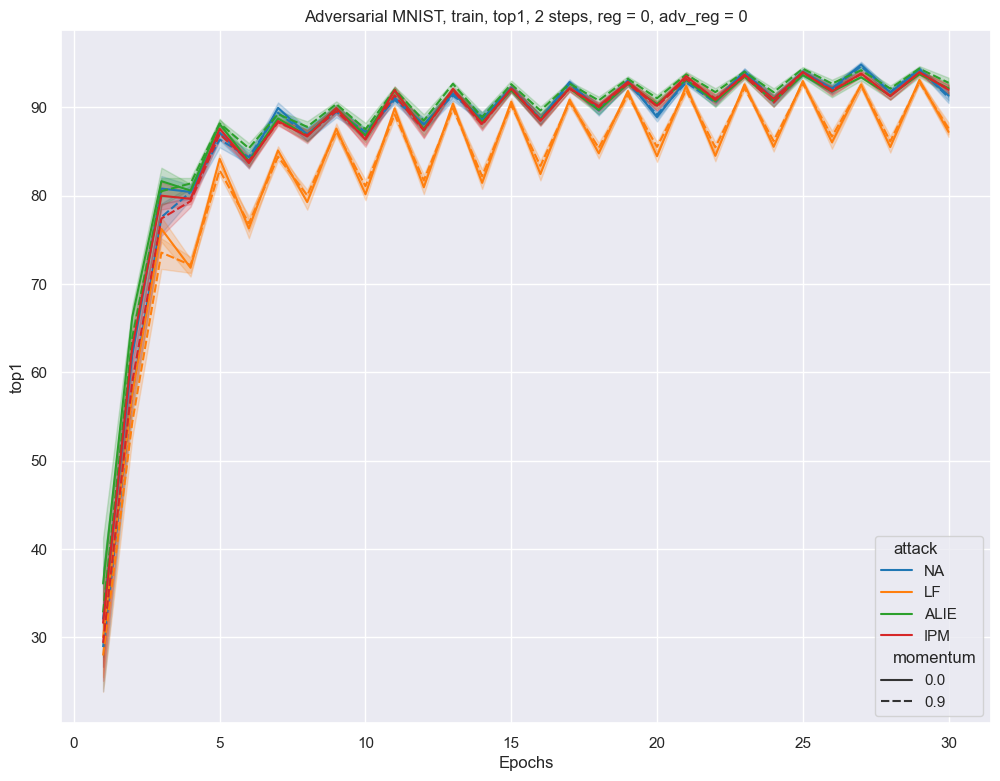

In [33]:
plot2(worker_steps=2, reg=0, adv_reg=0, mode="train")

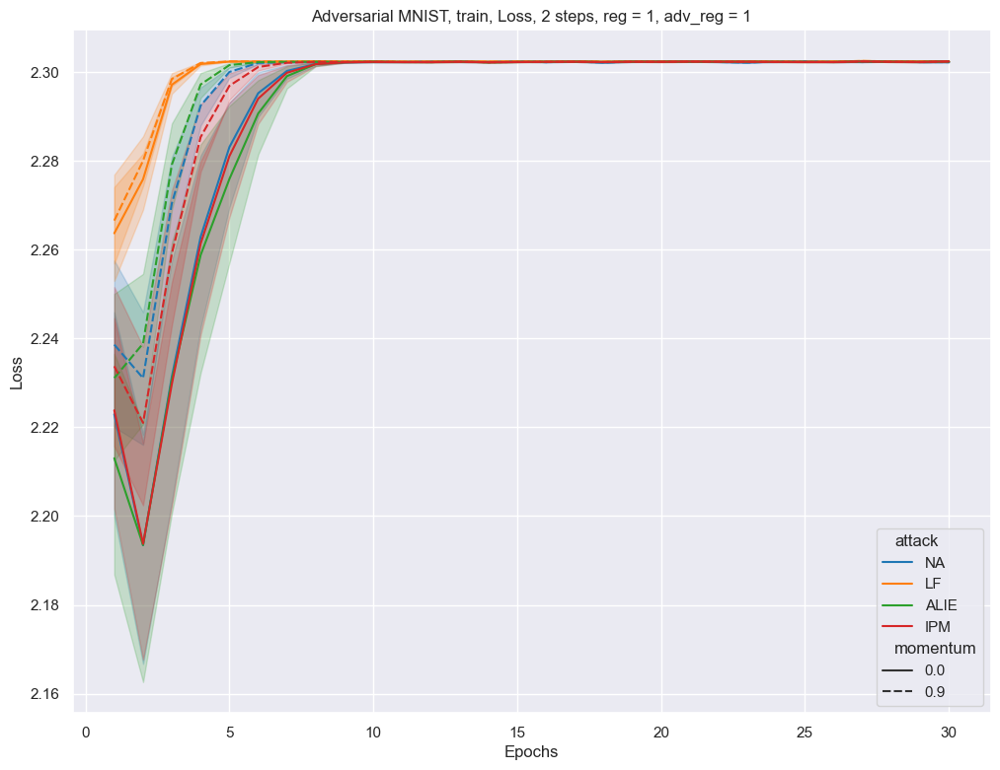

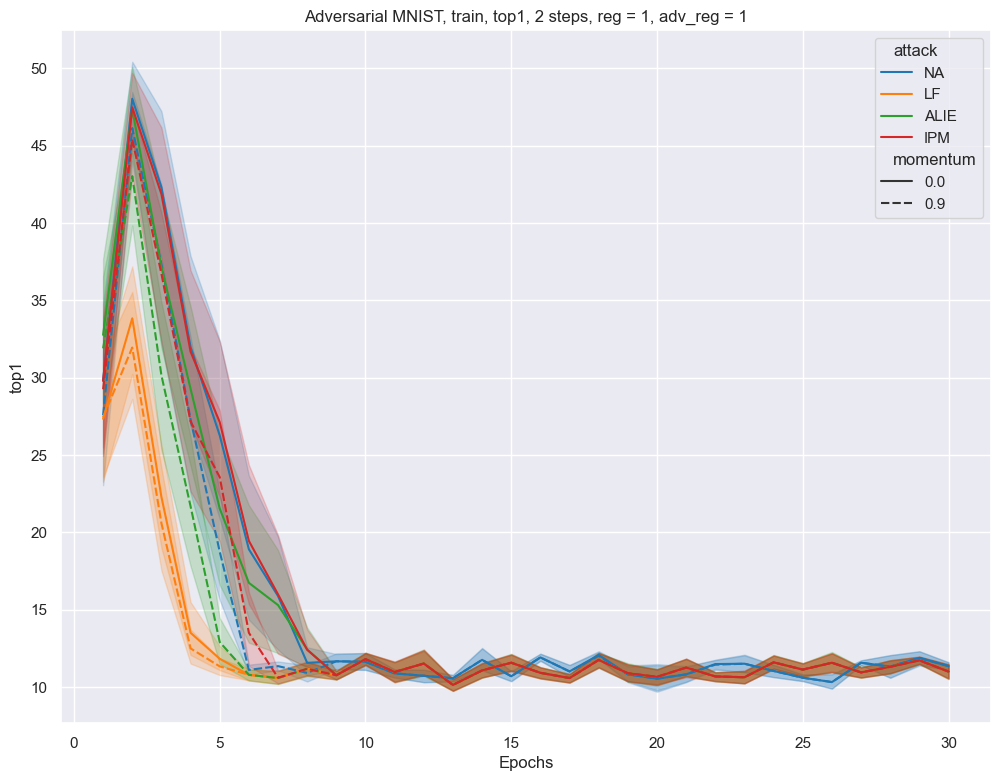

In [34]:
plot2(worker_steps=2, reg=1, adv_reg=1, mode="train")

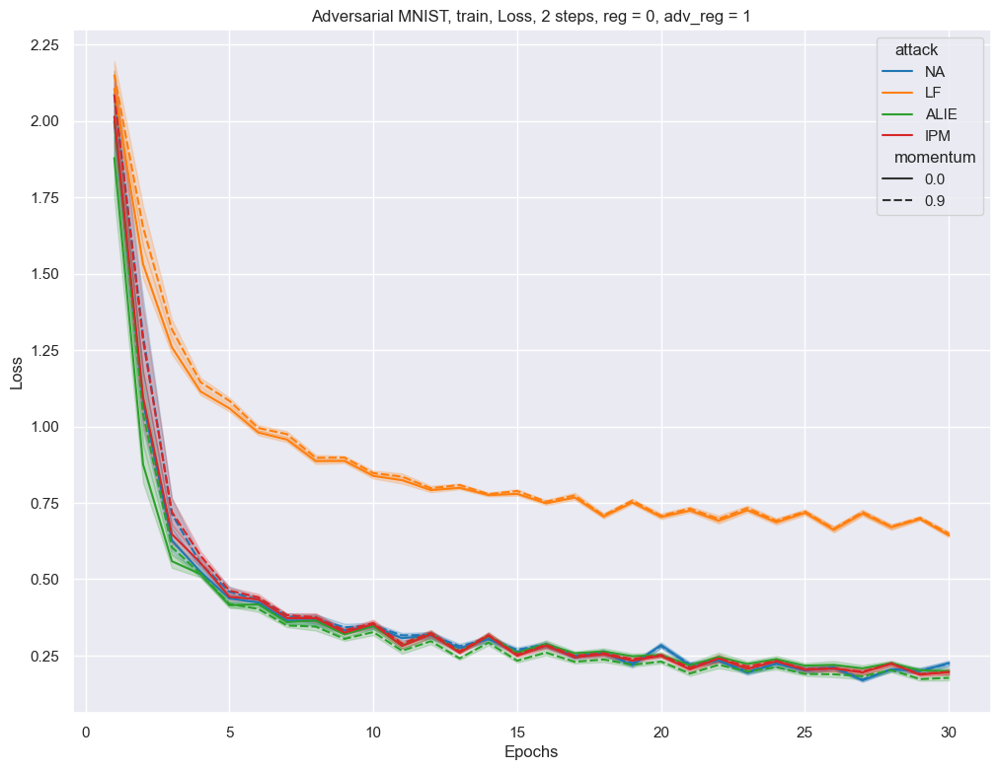

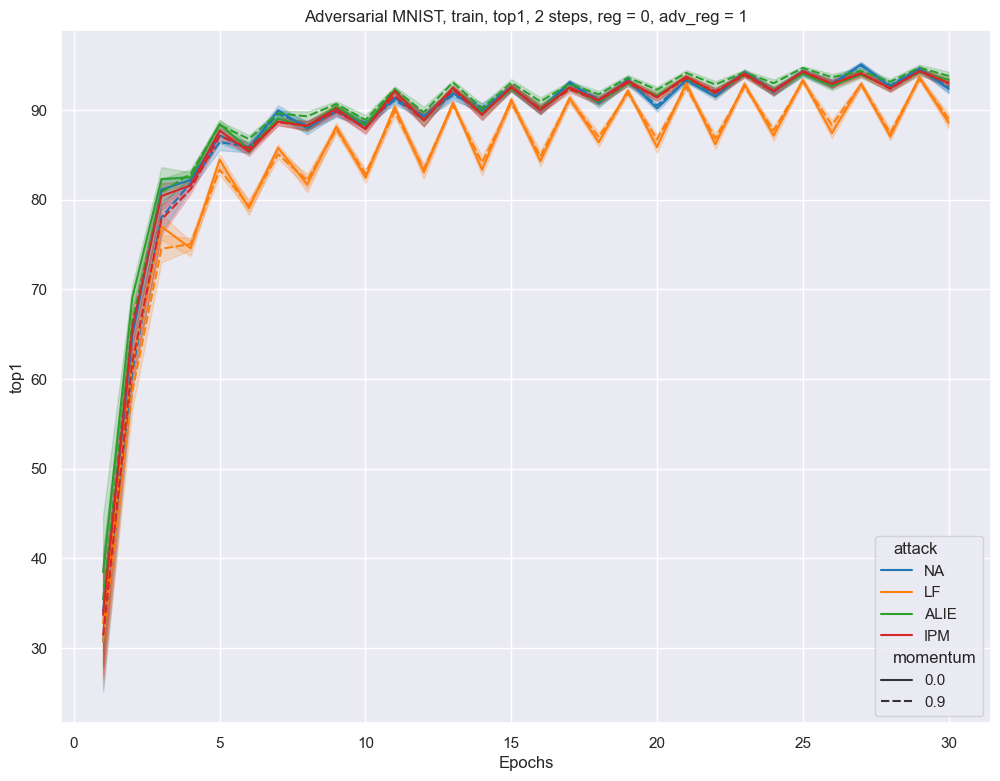

In [35]:
plot2(worker_steps=2, reg=0, adv_reg=1, mode="train")

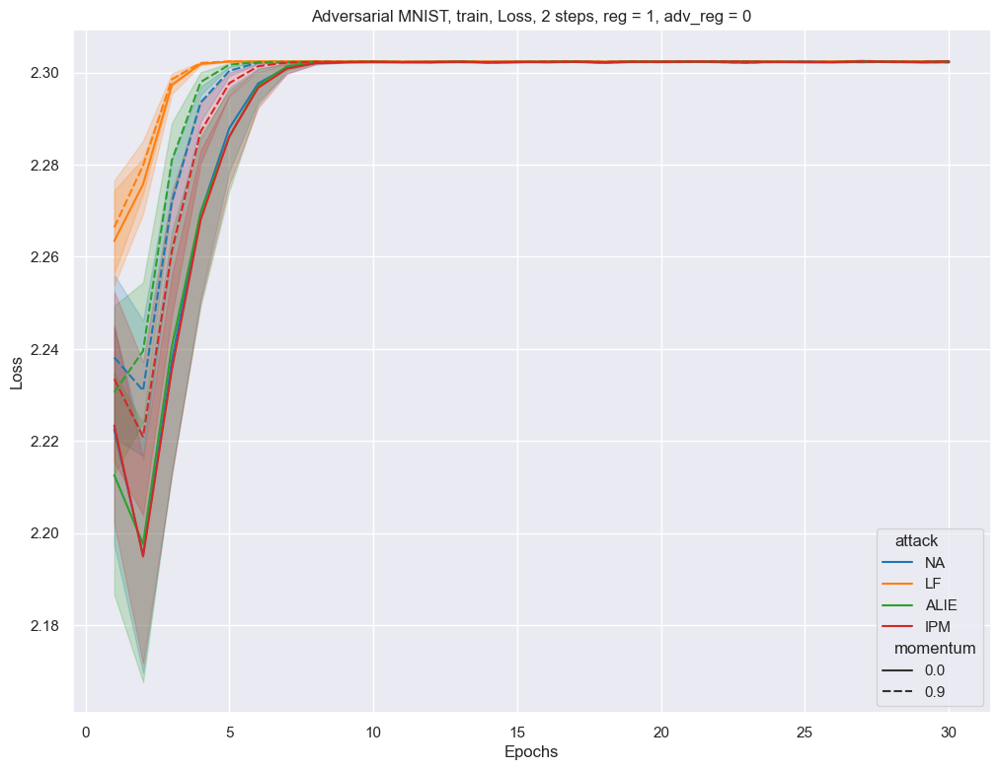

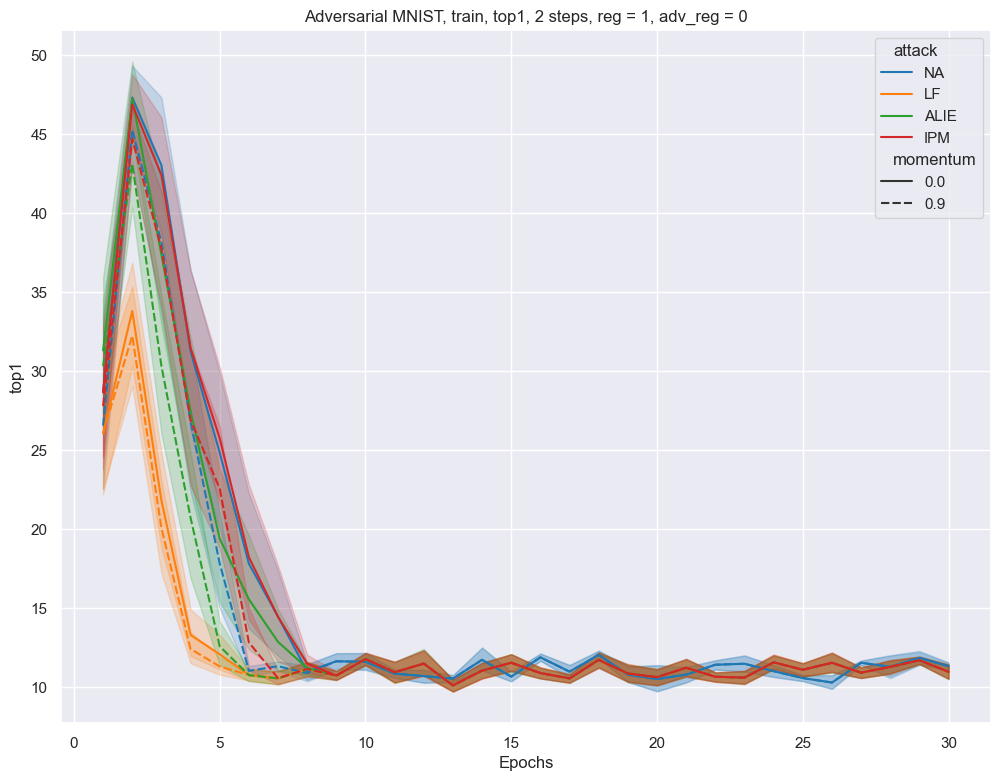

In [36]:
plot2(worker_steps=2, reg=1, adv_reg=0, mode="train")

# Experiment 3 (deprecated)

In [ ]:
EXP = "adv3-old"
log_dir = f"outputs/{EXP}"

In [68]:
exp_df_list = []
i = 0
for path in glob.glob(f"{log_dir}/*/*/stats"):
    # Parse logfile
    with open(path, "r") as f:
        lines = f.readlines()
        lines = [re.sub("tensor\(([^)]+)\)", '0.0', line) for line in lines]  # XXX: temporary fix
        stats = [ast.literal_eval(line) for line in lines]
        # Extract _meta variable
        for stat in stats:
            stat["type"] = stat["_meta"]["type"]
            del stat["_meta"]
    # Construct experiment dataframe
    stats_df = pd.DataFrame(stats)

    # Extract main args from path name
    experiment_dir = os.path.dirname(path)
    strategy = os.path.basename(os.path.dirname(experiment_dir))
    args_str = os.path.basename(experiment_dir)
    args_list = args_str.split("_")
    args_dict = {
        "n": int(args_list[0][1:]),
        "f": int(args_list[1][1:]),
        "agg": args_list[2],
        "attack": args_list[3],
        "seed": int(args_list[4][4:]),
        "reg": float(args_list[5][3:]),
        "adv_reg": float(args_list[6][6:]),
        "momentum": float(args_list[7][1:]),
        "strategy": strategy,
    }
    # Add args to stats dataframe
    for argname, argvalue in args_dict.items():
        stats_df[argname] = argvalue

    if len(exp_df_list) % 50 == 0:
        print(".", end="")
    i += 1

    exp_df_list.append(stats_df)

# Concat dataframes and remove irrelevant args
exp_df = pd.concat(exp_df_list).reset_index(drop=True).drop(columns=irrelevant_args)
print()
display(exp_df)

....


,E,B,Loss,top1,model_l2_norm,adversary_l2_norm,type,attack,seed,reg,adv_reg,momentum,strategy
0,1,0.0,2.310950,11.40625,8.866428,29.256021,train,NA,2,0.00,0.0,0.9,adam_robust2
1,1,10.0,2.263098,17.03125,8.866450,29.256027,train,NA,2,0.00,0.0,0.9,adam_robust2
2,1,20.0,2.220124,23.59375,8.867213,29.256039,train,NA,2,0.00,0.0,0.9,adam_robust2
3,1,30.0,2.170341,32.34375,8.868764,29.256046,train,NA,2,0.00,0.0,0.9,adam_robust2
4,1,40.0,2.121169,40.46875,8.871313,29.256048,train,NA,2,0.00,0.0,0.9,adam_robust2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
71968,30,80.0,0.749552,94.06250,8.122341,28.643291,train,LF,1,0.01,0.0,0.0,sgd_robust
71969,30,90.0,0.758025,92.81250,8.119514,28.643295,train,LF,1,0.01,0.0,0.0,sgd_robust
71970,30,100.0,0.740256,93.59375,8.116986,28.643330,train,LF,1,0.01,0.0,0.0,sgd_robust
71971,30,110.0,0.767312,94.21875,8.114448,28.643328,train,LF,1,0.01,0.0,0.0,sgd_robust


In [79]:
for col in exp_df.columns:
    print(col)

E
B
Loss
top1
model_l2_norm
adversary_l2_norm
type
attack
seed
reg
adv_reg
momentum
strategy


In [80]:
for col in ["attack", "seed", "reg", "adv_reg", "momentum", "strategy",]:
    print(col, exp_df[col].unique())

attack ['NA' 'LF' 'ALIE' 'IPM']
seed [2 1 0]
reg [0.   0.01]
adv_reg [0. 1.]
momentum [0.9 0. ]
strategy ['adam_robust2' 'sgd_cc' 'adam_robust' 'sgd_robust']


In [96]:
exp_df = exp_df.drop(index=exp_df[exp_df["strategy"] == "adam_robust2"].index)

In [97]:
# Take only validation loss
train_exp_df = exp_df[exp_df["type"] != "validation"].drop(columns=["type"])
valid_exp_df = exp_df[exp_df["type"] == "validation"].drop(columns=["type"])
train_exp_df

,E,B,Loss,top1,model_l2_norm,adversary_l2_norm,attack,seed,reg,adv_reg,momentum,strategy
18000,1,0.0,2.314466,10.62500,8.861330,27.795630,ALIE,0,0.00,1.0,0.0,sgd_cc
18001,1,10.0,2.254099,19.06250,8.861584,26.433365,ALIE,0,0.00,1.0,0.0,sgd_cc
18002,1,20.0,2.204280,30.00000,8.863040,25.137857,ALIE,0,0.00,1.0,0.0,sgd_cc
18003,1,30.0,2.147281,38.28125,8.865535,23.905830,ALIE,0,0.00,1.0,0.0,sgd_cc
18004,1,40.0,2.084312,40.62500,8.869328,22.734180,ALIE,0,0.00,1.0,0.0,sgd_cc
...,...,...,...,...,...,...,...,...,...,...,...,...
71967,30,70.0,0.714081,94.06250,8.124577,28.643280,LF,1,0.01,0.0,0.0,sgd_robust
71968,30,80.0,0.749552,94.06250,8.122341,28.643291,LF,1,0.01,0.0,0.0,sgd_robust
71969,30,90.0,0.758025,92.81250,8.119514,28.643295,LF,1,0.01,0.0,0.0,sgd_robust
71970,30,100.0,0.740256,93.59375,8.116986,28.643330,LF,1,0.01,0.0,0.0,sgd_robust


..................

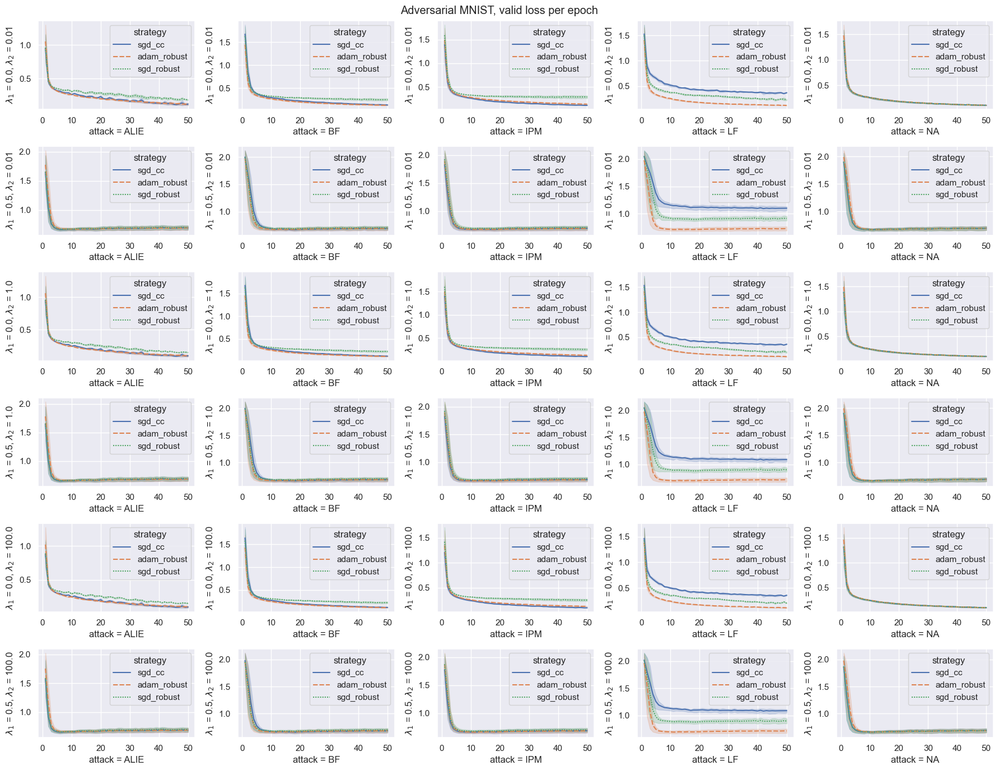

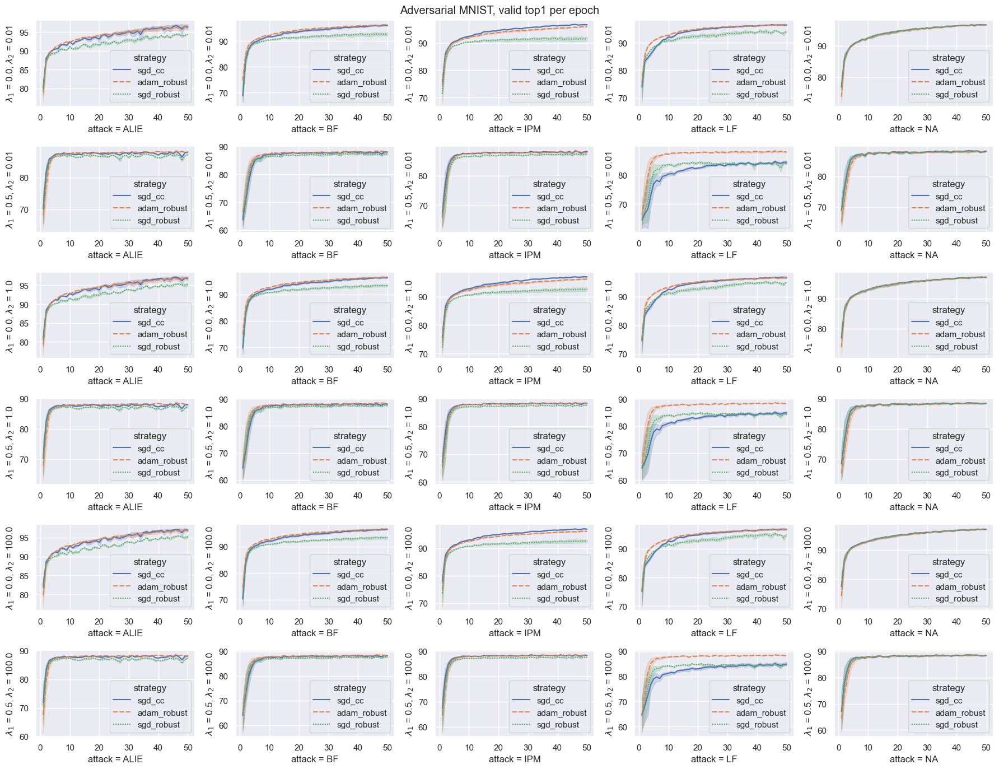

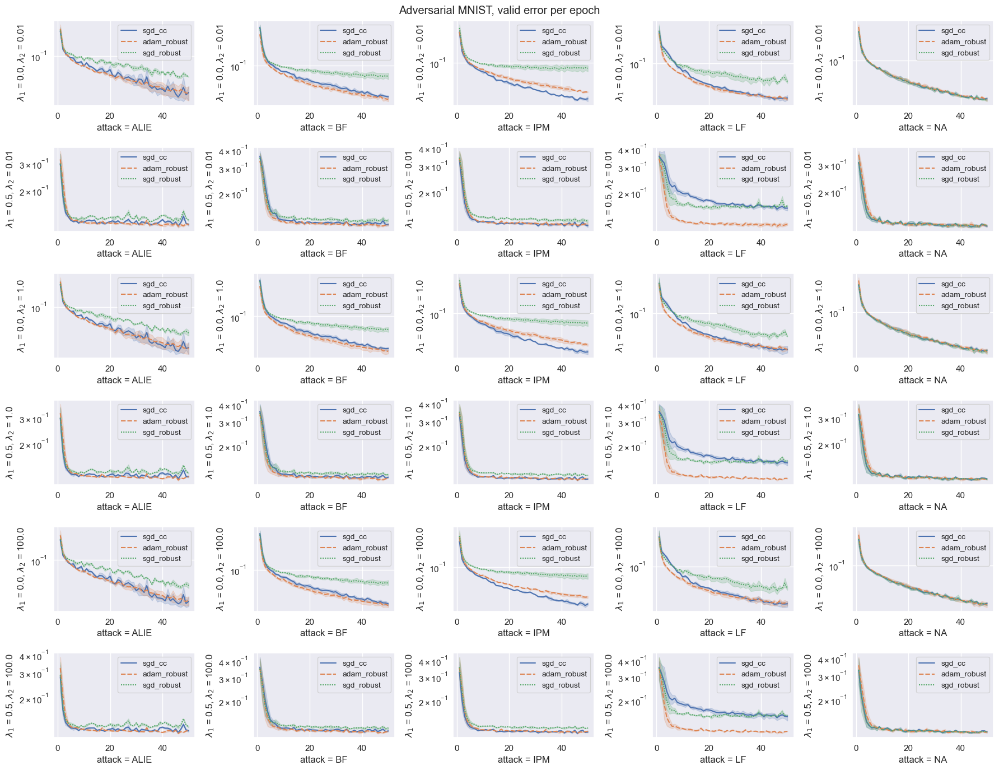

In [185]:
import itertools

kmap = {
    "reg": r"$\lambda_1$",
    "adv_reg": r"$\lambda_2$",
}

def plot3_old(mode="valid"):
    df = train_exp_df if mode == "train" else valid_exp_df
    keys = ["reg", "adv_reg", "attack", "strategy"]
    vals = [sorted(df[key].unique()) for key in keys]
    for metric in metrics:
        fig, ax = plt.subplots(len(vals[0])*len(vals[1]), len(vals[2]), figsize=(18, 14))
        for i1 in range(len(vals[0])):
            for i2 in range(len(vals[1])):
                for j in range(len(vals[2])):
                    plot_df = df[(df[keys[0]] == vals[0][i1]) &
                                 (df[keys[1]] == vals[1][i2]) &
                                 (df[keys[2]] == vals[2][j])]
                    i = i1 + 2 * i2
                    sns.lineplot(x="E", y=metric, hue=keys[3], style=keys[3], ax=ax[i,j], data=plot_df)
                    ax[i,j].set_ylabel(fr"{kmap[keys[0]]} = {vals[0][i1]}, {kmap[keys[1]]} = {vals[1][i2]}")
                    ax[i,j].set_xlabel(fr"{keys[2]} = {vals[2][j]}")
                    if metric == "error":
                        ax[i,j].set(yscale='log')
                        ax[i,j].legend(prop={'size': 10})
                print(".", end="")
        fig.suptitle(f"Adversarial MNIST, {mode} {metric.lower()} per epoch")
        plt.tight_layout()
        plt.savefig(f"outputs/adv3old_{metric}_{mode}.pdf")

plot3_old()

## Experiment 3

In [229]:
EXP = "adv3-final"
log_dir = f"outputs/{EXP}"

In [230]:
exp_df_list = []
i = 0
for path in glob.glob(f"{log_dir}/*/*/stats"):
    # Parse logfile
    with open(path, "r") as f:
        lines = f.readlines()
        lines = [re.sub("tensor\(([^)]+)\)", '0.0', line) for line in lines]  # XXX: temporary fix
        stats = [ast.literal_eval(line) for line in lines]
        # Extract _meta variable
        for stat in stats:
            stat["type"] = stat["_meta"]["type"]
            del stat["_meta"]
    # Construct experiment dataframe
    stats_df = pd.DataFrame(stats)

    # Extract main args from path name
    experiment_dir = os.path.dirname(path)
    strategy = os.path.basename(os.path.dirname(experiment_dir))
    args_str = os.path.basename(experiment_dir)
    args_list = args_str.split("_")
    args_dict = {
        "n": int(args_list[0][1:]),
        "f": int(args_list[1][1:]),
        "agg": args_list[2],
        "attack": args_list[3],
        "seed": int(args_list[4][4:]),
        "reg": float(args_list[5][3:]),
        "adv_reg": float(args_list[6][6:]),
        "momentum": float(args_list[7][1:]),
        "strategy": strategy,
    }
    # XXX: name correction
    if args_dict["strategy"] == "adam_robust":
        args_dict["strategy"] = "momentum_robust"
    # Add args to stats dataframe
    for argname, argvalue in args_dict.items():
        stats_df[argname] = argvalue

    if i % 50 == 0:
        print(".", end="")
    i += 1

    exp_df_list.append(stats_df)

# Concat dataframes and remove irrelevant args
exp_df = pd.concat(exp_df_list).reset_index(drop=True).drop(columns=irrelevant_args)
print()
display(exp_df)

....


,E,B,Loss,top1,model_l2_norm,adversary_l2_norm,type,agg,attack,seed,reg,adv_reg,momentum,strategy
0,1,0.0,2.308735,8.593750,8.861330,27.795630,train,rfa,NA,0,0.0,100.0,0.9,MSGDARA
1,1,10.0,2.261642,16.875000,8.861554,7.458082,train,rfa,NA,0,0.0,100.0,0.9,MSGDARA
2,1,20.0,2.203996,28.750000,8.862646,4.123777,train,rfa,NA,0,0.0,100.0,0.9,MSGDARA
3,1,30.0,2.159114,39.531250,8.864529,5.679144,train,rfa,NA,0,0.0,100.0,0.9,MSGDARA
4,1,40.0,2.097877,42.656250,8.867434,2.802000,train,rfa,NA,0,0.0,100.0,0.9,MSGDARA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84350,50,60.0,0.124319,95.781250,9.565372,0.001632,train,avg,NA,1,0.0,1.0,0.0,SGDACC
84351,50,70.0,0.105090,96.718750,9.566021,0.001641,train,avg,NA,1,0.0,1.0,0.0,SGDACC
84352,50,80.0,0.137071,95.937500,9.566693,0.001669,train,avg,NA,1,0.0,1.0,0.0,SGDACC
84353,50,90.0,0.129268,96.406250,9.567156,0.001632,train,avg,NA,1,0.0,1.0,0.0,SGDACC


In [231]:
exp_df["error"] = (100 - exp_df["top1"]) / 100
if len(metrics) == 2:
    metrics += ["error"]

In [232]:
# Take only validation loss
train_exp_df = exp_df[exp_df["type"] != "validation"].drop(columns=["type"])
valid_exp_df = exp_df[exp_df["type"] == "validation"].drop(columns=["type"])
train_exp_df

,E,B,Loss,top1,model_l2_norm,adversary_l2_norm,agg,attack,seed,reg,adv_reg,momentum,strategy,error
0,1,0.0,2.308735,8.59375,8.861330,27.795630,rfa,NA,0,0.0,100.0,0.9,MSGDARA,0.914062
1,1,10.0,2.261642,16.87500,8.861554,7.458082,rfa,NA,0,0.0,100.0,0.9,MSGDARA,0.831250
2,1,20.0,2.203996,28.75000,8.862646,4.123777,rfa,NA,0,0.0,100.0,0.9,MSGDARA,0.712500
3,1,30.0,2.159114,39.53125,8.864529,5.679144,rfa,NA,0,0.0,100.0,0.9,MSGDARA,0.604688
4,1,40.0,2.097877,42.65625,8.867434,2.802000,rfa,NA,0,0.0,100.0,0.9,MSGDARA,0.573438
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84349,50,50.0,0.095403,97.34375,9.564564,0.001503,avg,NA,1,0.0,1.0,0.0,SGDACC,0.026562
84350,50,60.0,0.124319,95.78125,9.565372,0.001632,avg,NA,1,0.0,1.0,0.0,SGDACC,0.042188
84351,50,70.0,0.105090,96.71875,9.566021,0.001641,avg,NA,1,0.0,1.0,0.0,SGDACC,0.032813
84352,50,80.0,0.137071,95.93750,9.566693,0.001669,avg,NA,1,0.0,1.0,0.0,SGDACC,0.040625


.............................................

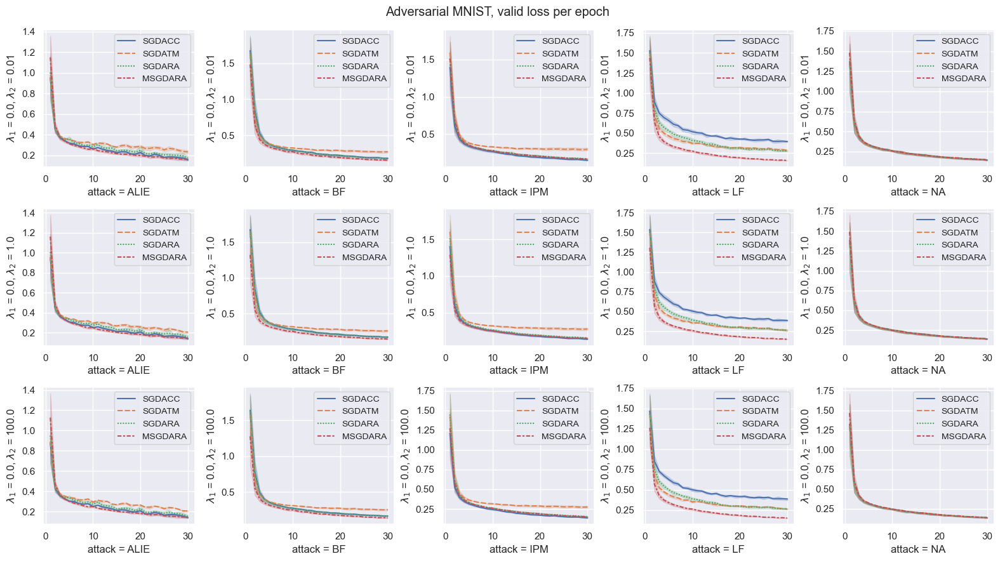

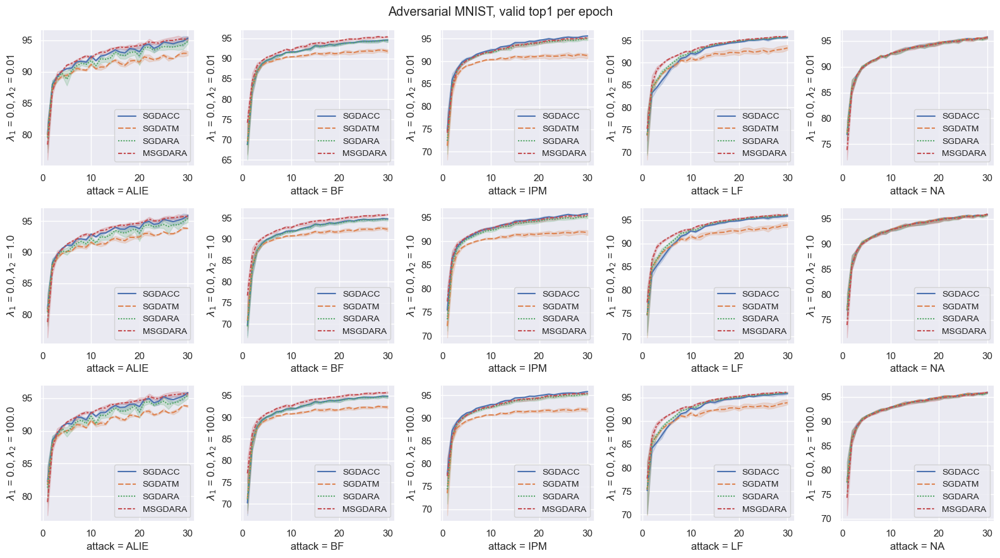

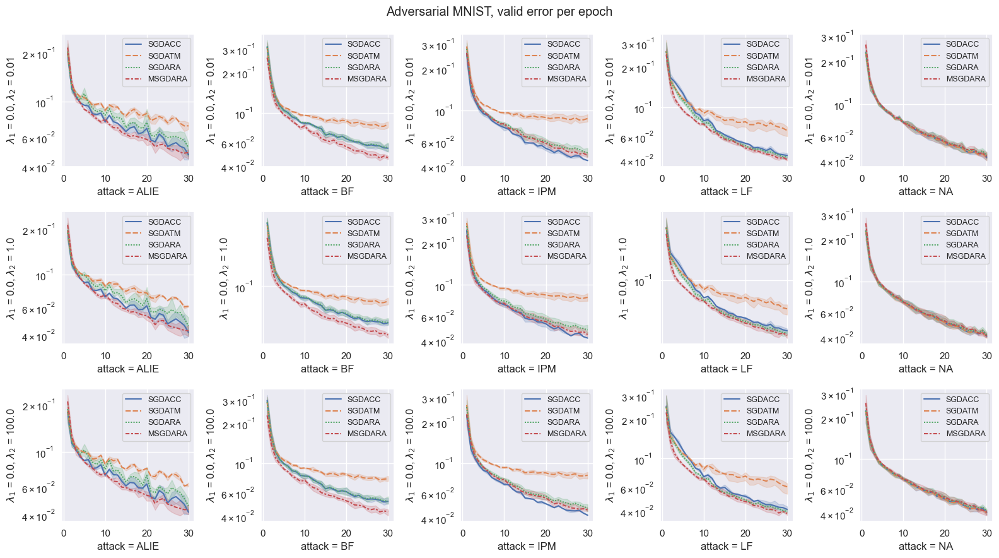

In [238]:
import itertools

kmap = {
    "reg": r"$\lambda_1$",
    "adv_reg": r"$\lambda_2$",
}

strat_order = ["SGDACC", "SGDATM", "SGDARA", "MSGDARA"]

def plot3_old(mode="valid"):
    df = train_exp_df if mode == "train" else valid_exp_df
    keys = ["reg", "adv_reg", "attack", "strategy"]
    vals = [sorted(df[key].unique()) for key in keys]
    for metric in metrics:
        fig, ax = plt.subplots(len(vals[0])*len(vals[1]), len(vals[2]), figsize=(16, 9))
        for i1 in range(len(vals[0])):
            for i2 in range(len(vals[1])):
                for j in range(len(vals[2])):
                    plot_df = df[(df[keys[0]] == vals[0][i1]) &
                                 (df[keys[1]] == vals[1][i2]) &
                                 (df[keys[2]] == vals[2][j])]
                    plot_df = plot_df[plot_df["E"] <= 30]
                    i = i1 + len(vals[0]) * i2
                    sns.lineplot(ax=ax[i,j], data=plot_df, x="E", y=metric,
                                 hue=keys[3], hue_order=strat_order, style=keys[3], style_order=strat_order,)
                    ax[i,j].set_ylabel(fr"{kmap[keys[0]]} = {vals[0][i1]}, {kmap[keys[1]]} = {vals[1][i2]}")
                    ax[i,j].set_xlabel(fr"{keys[2]} = {vals[2][j]}")
                    if metric == "error":
                        ax[i,j].set(yscale='log')
                        ax[i,j].legend(prop={'size': 9})
                    else:
                        ax[i,j].legend(prop={'size': 10})
                    print(".", end="")
        fig.suptitle(f"Adversarial MNIST, {mode} {metric.lower()} per epoch")
        plt.tight_layout()
        plt.savefig(f"outputs/adv_{metric}_{mode}.pdf")

plot3_old()

### Deprecated?

..............................

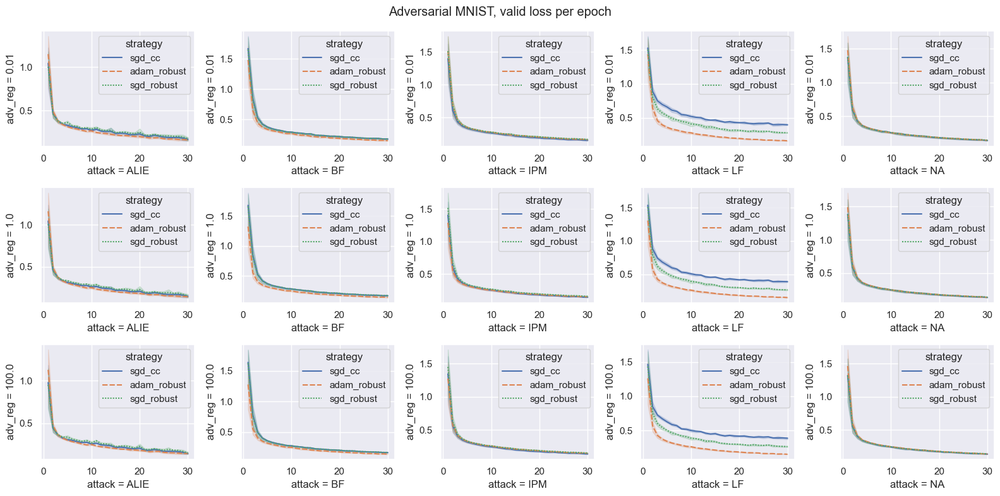

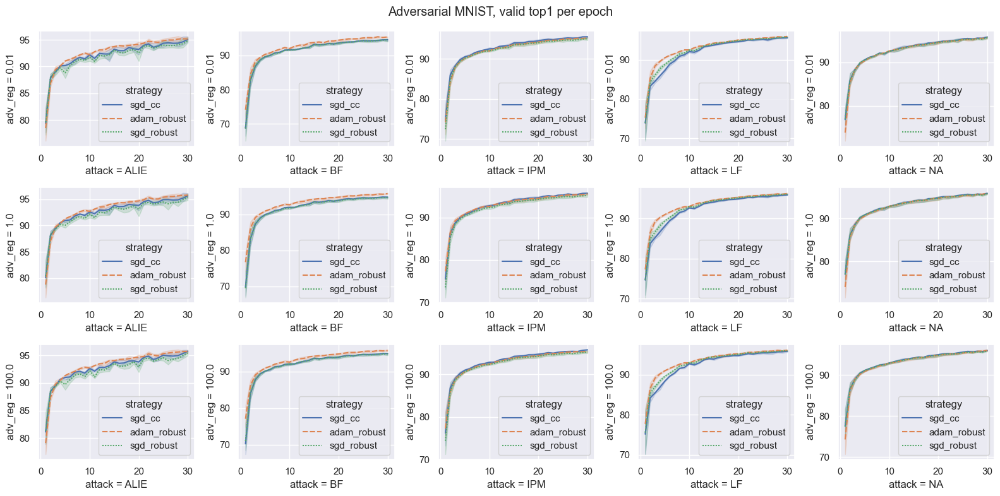

In [42]:
def plot3(mode="valid", reg=0.0):
    df = train_exp_df if mode == "train" else valid_exp_df
    keys = ["adv_reg",  "attack", "strategy"]
    vals = [sorted(df[key].unique()) for key in keys]
    for metric in metrics:
        fig, ax = plt.subplots(len(vals[0]), len(vals[1]), figsize=(16, 8))
        for i in range(len(vals[0])):
            for j in range(len(vals[1])):
                plot_df = df[(df[keys[0]] == vals[0][i]) & (df[keys[1]] == vals[1][j]) & (df["reg"] == reg)]
                sns.lineplot(x="E", y=metric, hue=keys[2], style=keys[2], ax=ax[i,j], data=plot_df)
                ax[i,j].set_ylabel(f"{keys[0]} = {vals[0][i]}")
                ax[i,j].set_xlabel(f"{keys[1]} = {vals[1][j]}")
                print(".", end="")
        fig.suptitle(f"Adversarial MNIST, {mode} {metric.lower()} per epoch")
        # plt.xlabel("Epochs")
        # plt.ylabel(metric)
        # plt.yscale("log")
        plt.tight_layout()
        plt.savefig(f"outputs/adv3_{metric}_{mode}.pdf")

plot3()

In [58]:
valid_exp_df[(valid_exp_df["attack"] == "NA") & ((valid_exp_df["strategy"] == "sgd_cc"))]["adv_reg"].unique()

array([1.e-02, 1.e+02, 1.e+00])

..............................

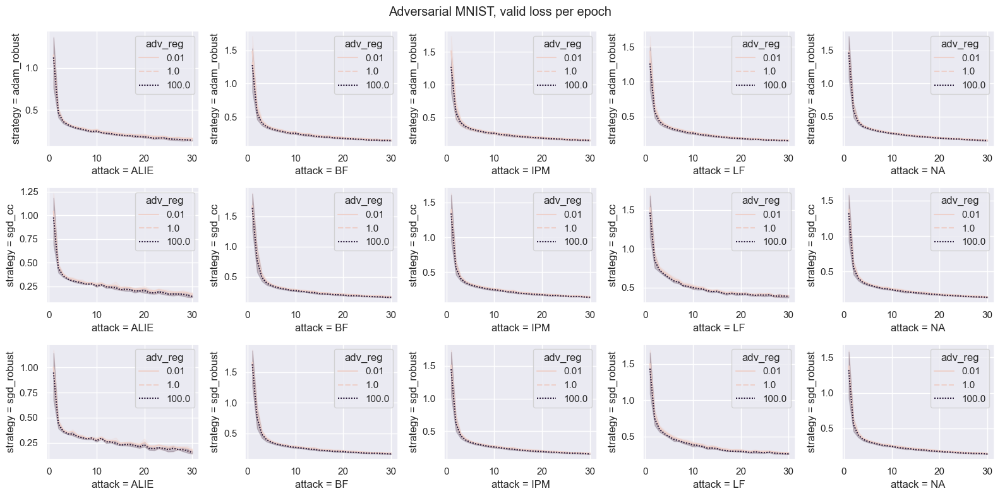

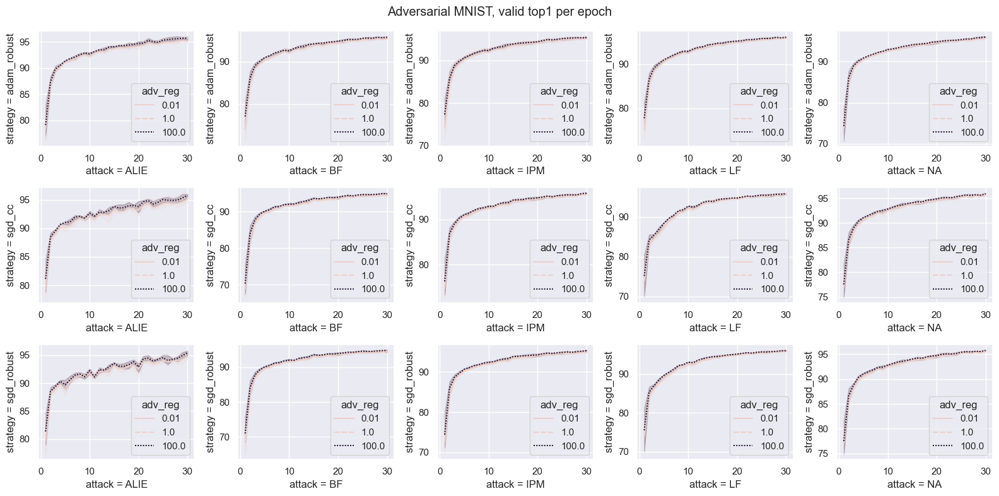

In [62]:
def plot3_other(mode="valid"):
    df = train_exp_df if mode == "train" else valid_exp_df
    keys = ["strategy",  "attack", "adv_reg",]
    vals = [sorted(df[key].unique()) for key in keys]
    for metric in metrics:
        fig, ax = plt.subplots(len(vals[0]), len(vals[1]), figsize=(16, 8))
        for i in range(len(vals[0])):
            for j in range(len(vals[1])):
                plot_df = df[(df[keys[0]] == vals[0][i]) & (df[keys[1]] == vals[1][j])]
                sns.lineplot(x="E", y=metric, hue=keys[2], style=keys[2], ax=ax[i,j], data=plot_df)
                ax[i,j].set_ylabel(f"{keys[0]} = {vals[0][i]}")
                ax[i,j].set_xlabel(f"{keys[1]} = {vals[1][j]}")
                print(".", end="")
        fig.suptitle(f"Adversarial MNIST, {mode} {metric.lower()} per epoch")
        # plt.yscale("log")
        plt.tight_layout()
        plt.savefig(f"outputs/adv3_other_{metric}_{mode}.pdf")

plot3_other()

# Experiment 4

In [2]:
EXP = "adv4"
log_dir = f"outputs/{EXP}"

In [11]:
exp_df_list = []
i = 0
for path in glob.glob(f"{log_dir}/*/*/stats"):
    # Parse logfile
    with open(path, "r") as f:
        lines = f.readlines()
        lines = [re.sub("tensor\(([^)]+)\)", '0.0', line) for line in lines]  # XXX: temporary fix
        stats = [ast.literal_eval(line) for line in lines]
        # Extract _meta variable
        for stat in stats:
            stat["type"] = stat["_meta"]["type"]
            del stat["_meta"]
    # Construct experiment dataframe
    stats_df = pd.DataFrame(stats)

    # Extract main args from path name
    experiment_dir = os.path.dirname(path)
    strategy = os.path.basename(os.path.dirname(experiment_dir))
    args_str = os.path.basename(experiment_dir)
    args_list = args_str.split("_")
    args_dict = {
        "n": int(args_list[0][1:]),
        "f": int(args_list[1][1:]),
        "agg": args_list[2],
        "attack": args_list[3],
        "seed": int(args_list[4][4:]),
        "reg": float(args_list[5][3:]),
        "adv_reg": float(args_list[6][6:]),
        "momentum": float(args_list[7][1:]),
        "worker_steps": int(args_list[8][6:]),
        "strategy": strategy.replace('_', '-'),
    }
    # XXX: nomenclature fix for NeurIPS 2023
    if args_dict["strategy"] == "SEG-TM":
        args_dict["strategy"] = "RDEG"
    elif args_dict["strategy"] == "SEG-TM-CC":
        continue

    # Add args to stats dataframe
    for argname, argvalue in args_dict.items():
        stats_df[argname] = argvalue

    if len(exp_df_list) % 50 == 0:
        print(".", end="")
    i += 1

    exp_df_list.append(stats_df)

# Concat dataframes and remove irrelevant args
exp_df = pd.concat(exp_df_list).reset_index(drop=True).drop(columns=irrelevant_args)
print()
display(exp_df)

..........


,E,B,Loss,top1,model_l2_norm,adversary_l2_norm,type,agg,attack,seed,reg,adv_reg,momentum,worker_steps,strategy
0,1,0.0,2.314988,12.812500,8.899955,28.631935,train,avg,IPM,1,0.0,100.0,0.0,2,SGDA-CC
1,1,10.0,2.168416,30.781250,8.902487,0.000055,train,avg,IPM,1,0.0,100.0,0.0,2,SGDA-CC
2,1,20.0,1.963725,46.406250,8.911652,0.000080,train,avg,IPM,1,0.0,100.0,0.0,2,SGDA-CC
3,1,30.0,1.655181,53.125000,8.928611,0.000116,train,avg,IPM,1,0.0,100.0,0.0,2,SGDA-CC
4,1,40.0,1.372512,60.625000,8.952935,0.000124,train,avg,IPM,1,0.0,100.0,0.0,2,SGDA-CC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203975,50,80.0,0.692766,95.937500,9.645820,29.259348,train,rfa,LF,2,0.0,0.0,0.0,1,SGDA-RA
203976,50,90.0,0.676186,96.875000,9.646717,29.259338,train,rfa,LF,2,0.0,0.0,0.0,1,SGDA-RA
203977,50,100.0,0.699772,95.781250,9.647437,29.259321,train,rfa,LF,2,0.0,0.0,0.0,1,SGDA-RA
203978,50,110.0,0.666964,96.406250,9.647766,29.259279,train,rfa,LF,2,0.0,0.0,0.0,1,SGDA-RA


In [12]:
exp_df["error"] = (100 - exp_df["top1"]) / 100
if len(metrics) == 2:
    metrics += ["error"]
# Take only validation loss
train_exp_df = exp_df[exp_df["type"] != "validation"].drop(columns=["type"])
valid_exp_df = exp_df[exp_df["type"] == "validation"].drop(columns=["type"])
train_exp_df

,E,B,Loss,top1,model_l2_norm,adversary_l2_norm,agg,attack,seed,reg,adv_reg,momentum,worker_steps,strategy,error
0,1,0.0,2.314988,12.81250,8.899955,28.631935,avg,IPM,1,0.0,100.0,0.0,2,SGDA-CC,0.871875
1,1,10.0,2.168416,30.78125,8.902487,0.000055,avg,IPM,1,0.0,100.0,0.0,2,SGDA-CC,0.692187
2,1,20.0,1.963725,46.40625,8.911652,0.000080,avg,IPM,1,0.0,100.0,0.0,2,SGDA-CC,0.535937
3,1,30.0,1.655181,53.12500,8.928611,0.000116,avg,IPM,1,0.0,100.0,0.0,2,SGDA-CC,0.468750
4,1,40.0,1.372512,60.62500,8.952935,0.000124,avg,IPM,1,0.0,100.0,0.0,2,SGDA-CC,0.393750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203974,50,70.0,0.682284,97.03125,9.645700,29.259373,rfa,LF,2,0.0,0.0,0.0,1,SGDA-RA,0.029687
203975,50,80.0,0.692766,95.93750,9.645820,29.259348,rfa,LF,2,0.0,0.0,0.0,1,SGDA-RA,0.040625
203976,50,90.0,0.676186,96.87500,9.646717,29.259338,rfa,LF,2,0.0,0.0,0.0,1,SGDA-RA,0.031250
203977,50,100.0,0.699772,95.78125,9.647437,29.259321,rfa,LF,2,0.0,0.0,0.0,1,SGDA-RA,0.042188


In [13]:
kmap = {
    "reg": r"$\lambda_1$",
    "adv_reg": r"$\lambda_2$",
}

exp_df["strategy"].unique().tolist()

['SGDA-CC', 'M-SGDA-RA', 'RDEG', 'SGDA-RA']

In [14]:
# strat_order = ['SGDA-CC', 'SGDA-RA', 'M-SGDA-RA', 'SEG-TM']
strat_order = ['SGDA-CC', 'SGDA-RA', 'M-SGDA-RA', 'RDEG']

In [15]:
def plot4(mode="valid", worker_steps=1):
    # Filter the dataframe given args
    df = train_exp_df if mode == "train" else valid_exp_df
    df = df[df["worker_steps"] == worker_steps]

    # The 'dimensions' (i.e. keys) of the plots and their possible values
    keys = ["reg", "adv_reg", "attack", "strategy"]
    vals = [sorted(df[key].unique()) for key in keys]

    # Plot
    for metric in metrics:
        fig, ax = plt.subplots(len(vals[0])*len(vals[1]), len(vals[2]), figsize=(16, 9))
        for i1 in range(len(vals[0])):
            for i2 in range(len(vals[1])):
                for j in range(len(vals[2])):
                    plot_df = df[(df[keys[0]] == vals[0][i1]) &
                                 (df[keys[1]] == vals[1][i2]) &
                                 (df[keys[2]] == vals[2][j])]
                    i = i1 + len(vals[0]) * i2
                    sns.lineplot(ax=ax[i,j], data=plot_df, x="E", y=metric,
                                 hue=keys[3], hue_order=strat_order, style=keys[3], style_order=strat_order,)
                    ax[i,j].set_ylabel(fr"{kmap[keys[0]]} = {vals[0][i1]}, {kmap[keys[1]]} = {vals[1][i2]}")
                    ax[i,j].set_xlabel(fr"{keys[2]} = {vals[2][j]}")
                    if metric == "error":
                        ax[i,j].set(yscale='log')
                        ax[i,j].legend(prop={'size': 9})
                    else:
                        ax[i,j].legend(prop={'size': 10})
                    print(".", end="")
        fig.suptitle(f"Adversarial MNIST, {mode} {metric.lower()} per epoch")
        plt.tight_layout()
        plt.savefig(f"outputs/{EXP}_{metric}_{mode}_wsteps{worker_steps}.pdf")

............................................................

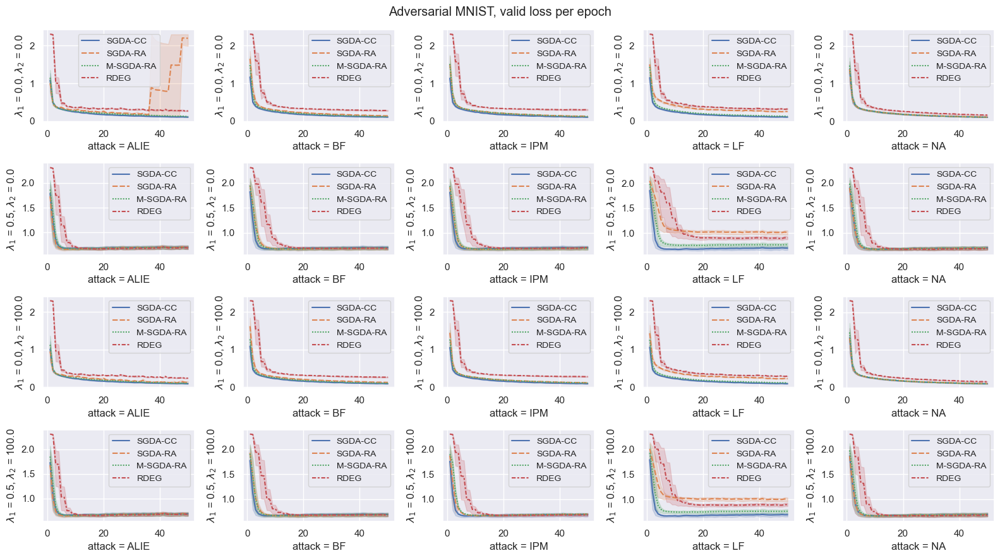

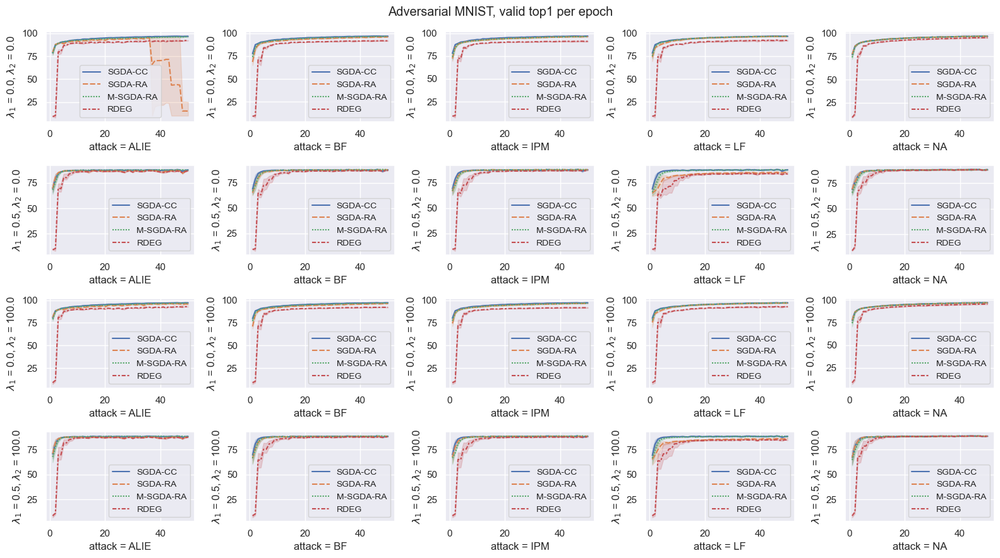

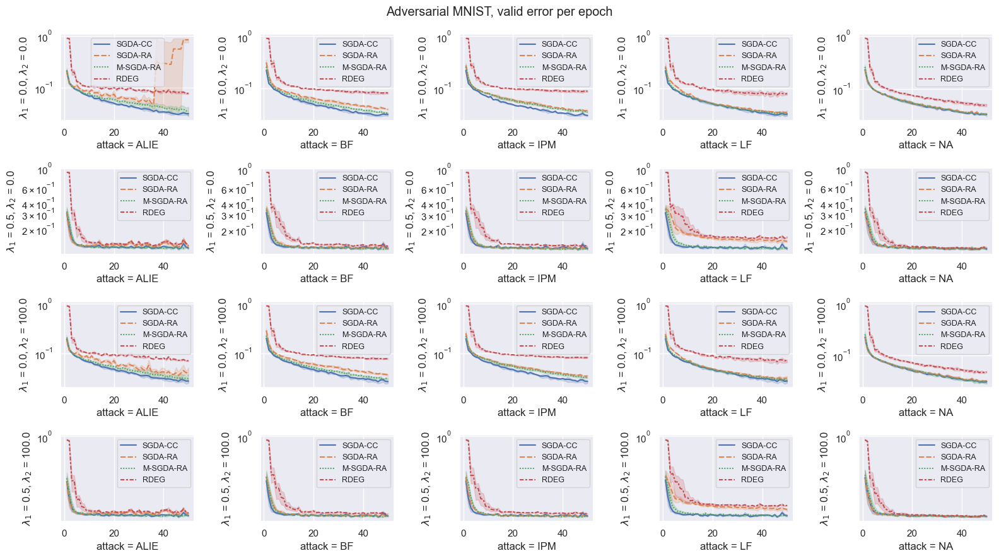

In [16]:
plot4(worker_steps=1)

............................................................

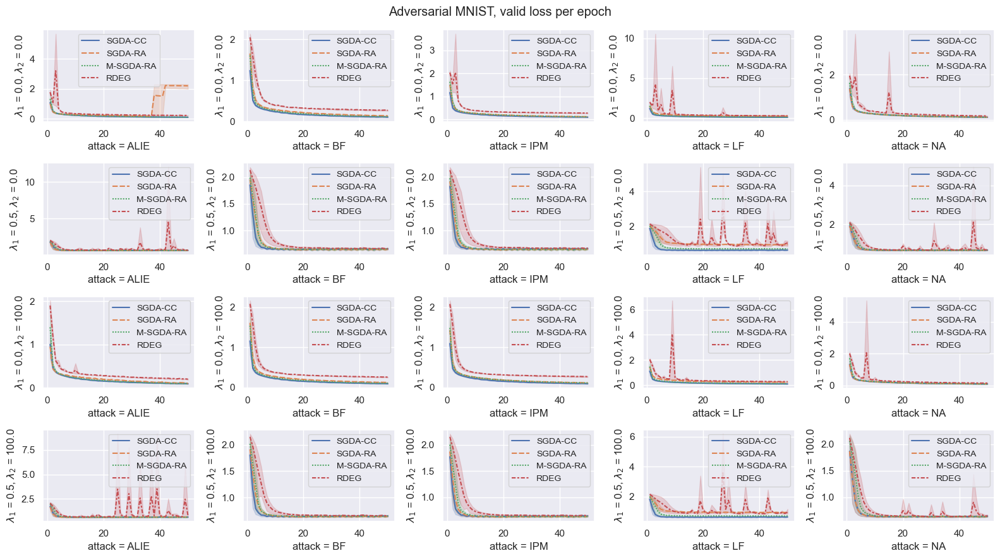

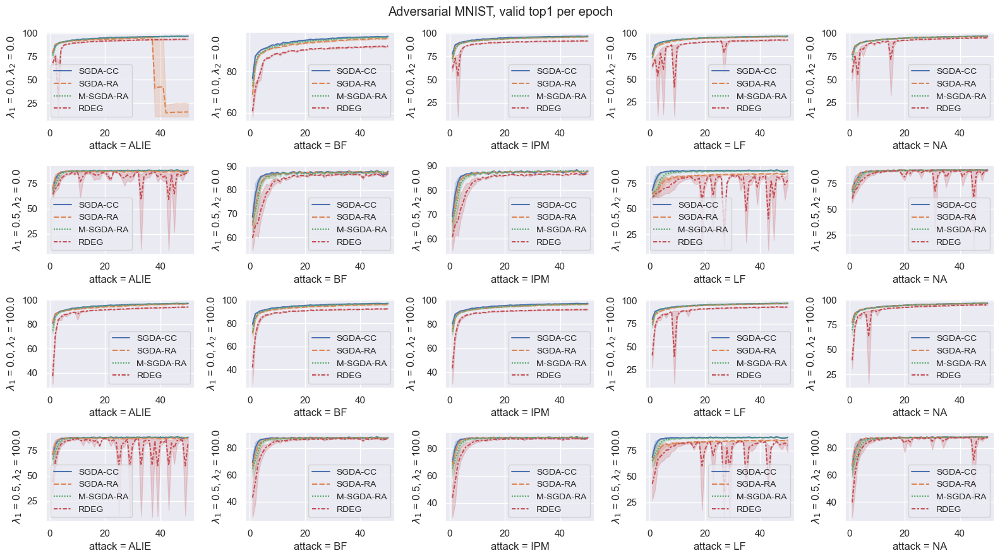

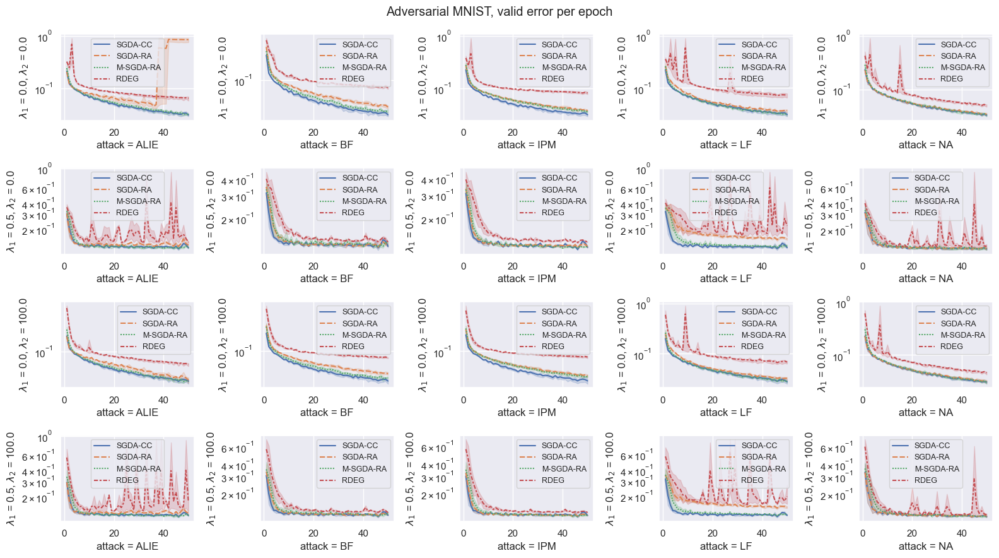

In [17]:
plot4(worker_steps=2)

In [18]:
def plot4_sep(mode="valid", worker_steps=1, reg=None, adv_reg=None):
    # Filter the dataframe given args
    df = train_exp_df if mode == "train" else valid_exp_df
    df = df[df["worker_steps"] == worker_steps]
    if reg is not None:
        df = df[df["reg"] == reg]
    if adv_reg is not None:
        df = df[df["adv_reg"] == adv_reg]

    # The 'dimensions' (i.e. keys) of the plots and their possible values
    keys = ["reg", "adv_reg", "attack", "strategy"]
    vals = {key : sorted(df[key].unique()) for key in keys}

    # Plot
    for metric in metrics:
        for i1, reg in enumerate(vals["reg"]):
            for i2, adv_reg in enumerate(vals["adv_reg"]):
                for attack in vals["attack"]:
                    plot_df = df[(df["reg"] == reg) &
                                 (df["adv_reg"] == adv_reg) &
                                 (df["attack"] == attack)]
                    i = i1 + len(vals["reg"]) * i2
                    fig, ax = plt.subplots(figsize=(5, 3))
                    sns.lineplot(ax=ax, data=plot_df, x="E", y=metric,
                                 hue="strategy", hue_order=strat_order,
                                 style="strategy", style_order=strat_order,)
                    ax.set_ylabel(metric.capitalize())
                    ax.set_xlabel("Epochs")
                    if metric == "error":
                        ax.set(yscale='log')
                    ax.set_title(f"Adversarial MNIST {metric.capitalize()}, attack = {attack}")
                    plt.tight_layout()
                    plt.savefig(f"outputs/{EXP}_{metric}_{attack}.pdf")
                    print(".", end="")

...............

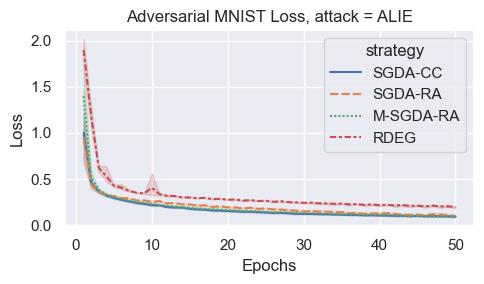

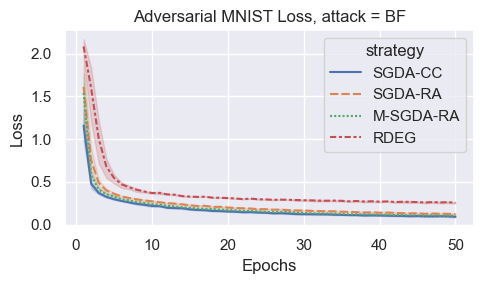

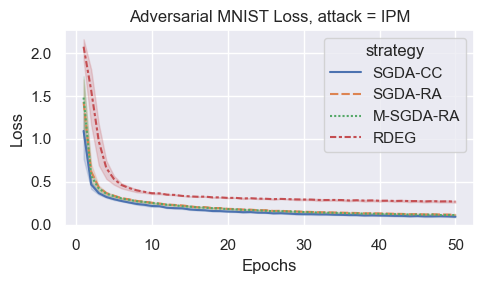

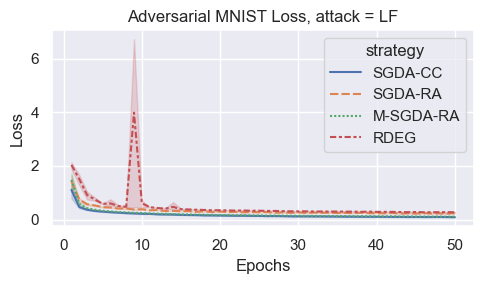

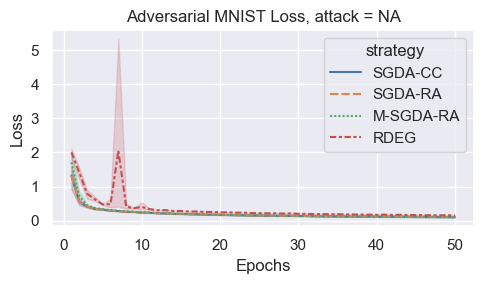

...

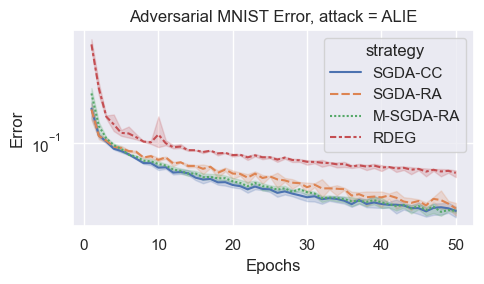

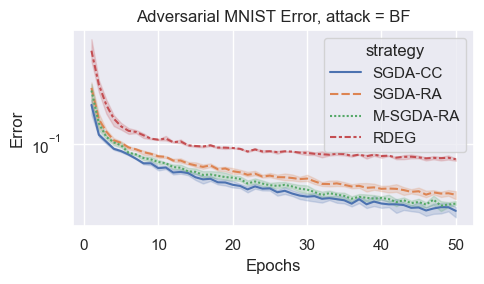

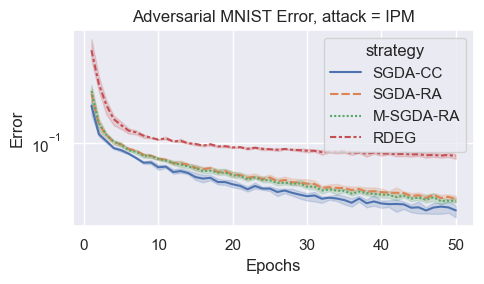

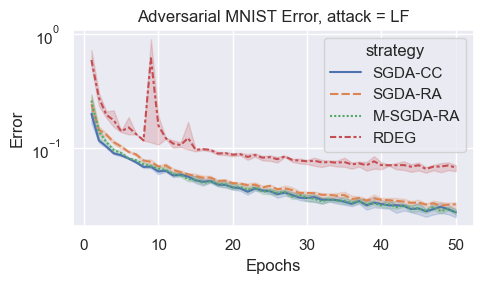

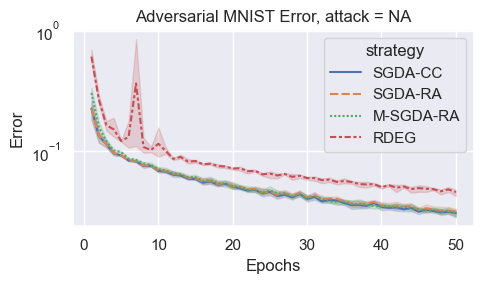

In [19]:
plot4_sep(worker_steps=2, reg=0., adv_reg=100.)

# Plot FIDs

In [5]:
ep = [300, 1000, 1800, 2500, 3200, 3900, 4600]

FIDs = {
    'SGDA-RA': {
        'NA': [54.60, 49.83, 39.66, 35.23, 33.67, 31.64, 30.98],
        'ALIE': [58.27, 52.29, 44.35, 40.53, 40.57, 39.99, 39.62],
        'IPM': [59.80, 54.36, 42.98, 36.20, 33.46, 33.47, 33.07],
        'LF': [54.59, 51.01, 37.64, 34.99, 32.99, 32.26, 31.01],
    },
    'SGDA-CC': {
        'NA': [55.96, 45.86, 42.55, 36.87, 36.01, 32.82, 30.98],
        'ALIE': [55.22, 45.54, 38.94, 35.33, 35.38, 31.34, 29.61],
        'IPM': [54.18, 44.45, 35.55, 33.26, 33.56, 30.18, 29.54],
        'LF': [55.24, 44.19, 36.92, 33.99, 32.35, 30.95, 29.81],
    }
}

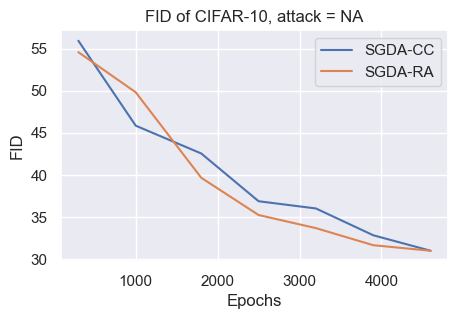

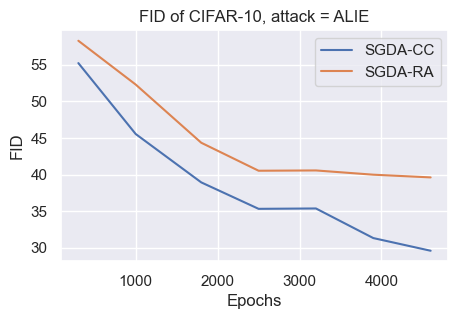

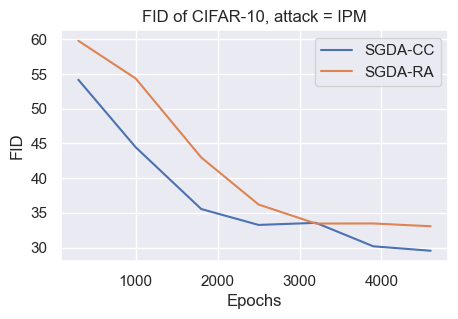

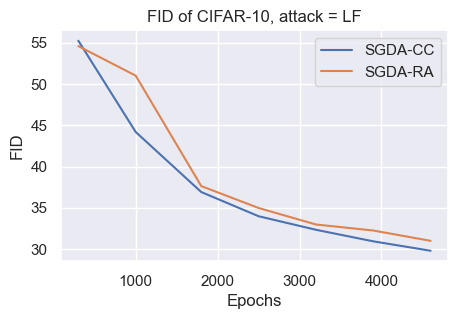

In [10]:
for attack in ['NA', 'ALIE', 'IPM', 'LF']:
    plt.figure(figsize=(5,3))
    for algorithm in ['SGDA-CC', 'SGDA-RA']:
        plt.plot(ep, FIDs[algorithm][attack], label=algorithm)
    plt.title(f"FID of CIFAR-10, attack = {attack}")
    plt.xlabel("Epochs")
    plt.ylabel("FID")
    plt.legend()
    plt.savefig(f"outputs/FID_{attack}.png")
